
|item|line|note|
|:-|:-|:-|
|2024年9月6日14:45:27|4962|上次写了4962行,这回应该不会有那么多吧|
|2024年9月8日00:24:09|2394|....没救了|
|2024年9月10日19:10:51|3161|还行hhhhh,这回顶天冲个4000|

In [1]:
from init_plot import *

2024-09-15 16:19:39.564093: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


[func help]----------------------------------------------------------------
> parameter
    p_root	[name] res_publish
        p_run, p_plot, p_res, p_cache, p_pdf
    p_df_varmap
    map_sp_reverse
    rng
[from func import * ]------------------------------------------------------
| p_root                  | display              | get_res_obs               |
| p_run                   | h5ad_to_mtx          | get_source_obs            |
| p_plot                  | load_adata           | get_matrix_max_prob_median|
| p_res                   | load_normalized_adata| get_matrix_count          |
| p_cache                 | pdf2_merge           | get_path_varmap           |
| p_pdf                   | show_umap            | get_res_stat              |
| p_data_process          | time_tag_detect      | find_path_from_para       |
| map_sp                  | time_tag_get         | func_help                 |
| map_sp_reverse          | time_tag_toggle      |                           |
| map_s

In [2]:
item = "LN"
model = "csMAHN"
if len(sys.argv) == 3:
    if sys.argv[1] == "True":
        model = sys.argv[2]
assert model in "Seurat,came,csMAHN,SAMap".split(
    ","
), '[Error] Invalid modle "{}"'.format(model)

def handel_model_label(data):
    """ 构造obs 的
    model_label ： ref 的 true_label 以及 que 的 pre label
"""
    data['model_label'] = ''
    data['model_label'] = data['model_label'].mask(data['dataset_type'] == 'ref', data['true_label'])\
        .mask(data['dataset_type'] == 'que', data['pre_label'])
    return data

def handel_que_gene_set_score(adata, geneset, score_name, key_group='dataset_id', ctrl_size=None):
    adata_s = [ut.sc.subset_adata(adata, key_group, i).copy()
               for i in adata.obs[key_group].unique()]
    ctrl_size = len(geneset) if ctrl_size is None else ctrl_size
    [sc.tl.score_genes(i, geneset, score_name=score_name, ctrl_size=ctrl_size) for i in adata_s]
    adata.obs[score_name] = pd.concat([i.obs[score_name] for i in adata_s])
    return adata

def handle_func_chi(data, order, axis=0):
    stats_res = ut.sc.scipy.stats.chisquare(data, axis=axis)
    # return stats_res
    data['statistic'] = stats_res.statistic
    data['pvalue'] = stats_res.pvalue
    data['padj'] = ut.sc.scipy.stats.false_discovery_control(data['pvalue'], method='bh')
    data['marker'] = data['padj'].apply(lambda x: pl.tl_get_significance_marker(x))
    data = data.loc[:, 'healthy,LN'.split(',')].transpose().pipe(pl.bar_count_to_ratio)\
        .rename(columns=lambda x: 'ratio_{}'.format(x)).join(data)
    data['tendency'] = data.eval('ratio_LN - ratio_healthy > 0').map({True: 'up', False: 'down'})\
        .mask(data['marker'] == 'ns',data['marker'])
    data = ut.df.get(data, order)
    return data

In [3]:
with Block("""
ppara_func
    violin_gene_score
    df_varmap_query_exists
    process_multiple_test_df
    hbar
    heatmap
"""):
    with Block("violin_gene_score"):

        def _func(adata, gene, ax, key_groupby="label",
                  groupby_order=None, color_map=None, del_xticks=True):
            def _get_tick(v):
                res = np.array([0, 1])
                for cutoff, res_cutoff in zip(
                    [10, 7.5, 5, 2.5], [np.linspace(0, 10, 4 +
                                                    1), np.linspace(0, 7.5, 3 +
                                                                    1), np.linspace(0, 5, 2 +
                                        1), np.linspace(0, 2, 2 +
                                        1),],
                ):
                    if v > cutoff:
                        res = res_cutoff
                        break
                return res

            df_plot = sc.get.obs_df(adata, [key_groupby, gene]).query("`{}` > 0".format(gene)
                                                                      )
            df_plot[key_groupby] = df_plot[key_groupby].astype(str)
            if groupby_order is None:
                groupby_order = np.sort(adata.obs[key_groupby].unique())
            df_plot = df_plot.sort_values(key_groupby, key=lambda s: s.map(
                {_: i for i, (_) in enumerate(groupby_order)}), ascending=True,)
            _palette = None
            if color_map is None:
                _palette = pl.cmap.get(groupby_order).values()
            else:
                _palette = [color_map[i]
                            for i in groupby_order if i in df_plot[key_groupby].unique()]
            sns.violinplot(df_plot, x=key_groupby, y=gene, orient="x", fill=False, ax=ax, hue=key_groupby, palette=_palette, linewidth=0.75,
                           inner_kws=dict(box_width=2, whis_width=0.75),
                           )
            ax.set_xlabel(""), ax.set_ylabel("")

            if del_xticks:
                ax.set_xticks([], [], **fontdict_default)
            else:
                ax.set_xticks(ax.get_xticks(),
                              [i.get_text() for i in ax.get_xticklabels()],
                              rotation=90,
                              **fontdict_default)
            ax.set_yticks(ax.get_yticks(), [i.get_text()
                          for i in ax.get_yticklabels()], **fontdict_default)
            ax.set_frame_on(False)
            ax.grid(False)
            # ax.set_ylim(-10, max(ax.get_ylim()))

        ppara_func["violin_gene_score"] = _func
        del _func

    with Block("process_multiple_test_df"):
        def _func(data, order):
            data["marker"] = data["padj"].apply(lambda x: pl.tl_get_significance_marker(x))
            data = ut.df.reindex_with_unique_col(data, "value_y").loc[
                [i for i in order if i in data.index], :]
            data["x"] = np.arange(data.shape[0]) + 1
            data["color"] = (
                data["mean_diff"]
                .apply(lambda x: "red" if x > 0 else "blue")
                .mask(data["padj"] > 0.05, "grey")
            )
            return data

        ppara_func["process_multiple_test_df"] = _func
        del _func

    with Block("hbar"):
        def _func(df_plot, color_map, ax):
            keys = [i.replace("_bottom", "") for i in df_plot.filter(regex="_bottom$").columns]
            for i, row in df_plot.iterrows():
                ax.barh(y=1 + np.arange(len(keys)), width=[row[k] for k in keys],
                        height=0.6, left=[_row["{}_bottom".format(k)] for k in keys],
                        color=color_map[row.name], alpha=0.8, label=row.name,)
            ax.tick_params("both", which="both", length=0, width=0)
            ax.set_xlim(0, 1)
            ax.set_xticks(np.linspace(0, 1, 6), ["{:.0f}%".format(i * 100) for i in np.linspace(0, 1, 6)],
                          **fontdict_default)
            ax.set_yticks(1 + np.arange(len(keys)), keys, rotation=0, **fontdict_default)
        ppara_func["hbar"] = _func
        del _func

    with Block("heatmap"):
        def _func(
            df_plot,
            ax,
            cmap=cm,
            fontdict_tick=fontdict_default,
            fontdict_axes_title=fontdict_axes_title,
        ):
            sns.heatmap(df_plot, square=True, cmap="Blues", cbar=False, ax=ax)
            text = df_plot.index
            ax.set_yticks(np.arange(len(text)) + 0.5, text, **fontdict_tick)
            text = df_plot.columns
            ax.set_xticks(np.arange(len(text)) + 0.5, text, **fontdict_tick)
            ax.set_ylabel(df_plot.index.name, fontdict=fontdict_axes_title)
            ax.set_xlabel(df_plot.columns.name, fontdict=fontdict_axes_title)
        ppara_func["heatmap"] = _func
        del _func

with Block("""
ppara_func
    umap_gene
    heatmap_enrich
    sc_sum_genes_raw_counts
    brokenaxes_marker
    violin_gene_score_update
"""):
    with Block("umap_gene"):
        def _func(df_plot, key_values, size=5, ax=None, cmap=mpl.colormaps["bwr"],
                  key_uamp="UMAP1,UMAP2".split(","), colorbar_loc=None, kw_pl_umap={}
                  ):
            if isinstance(key_values, str):
                key_values = [key_values]
            adata = sc.AnnData(obs=df_plot)
            adata.obsm["X_umap"] = adata.obs.loc[:, key_uamp].to_numpy()
            adata
            sc.pl.umap(adata, color=key_values, sort_order=True, cmap=cmap, size=size,
                       ax=ax, colorbar_loc=colorbar_loc, frameon=False, show=False, title="", **kw_pl_umap)
        ppara_func["umap_gene"] = _func
        del _func

    with Block("heatmap_enrich"):
        def _func(df_plot, ax, yticks_right=False, xticks_top=False,
                  del_xticks=False, vmax=5e-2, vmin=0, cbar=True, cbar_kws=None,):
            ax = sns.heatmap(df_plot, annot_kws=fontdict_default,
                             cmap=cm_2, ax=ax, square=True, vmax=vmax, vmin=vmin, cbar=cbar, cbar_kws=cbar_kws)
            ax.set_ylabel("")
            ax.tick_params("both", width=0, length=0)
            ax.yaxis.tick_right() if yticks_right else None
            ax.set_yticks(ax.get_yticks(), [_.get_text() for _ in ax.get_yticklabels()],
                          **{
                "fontfamily": ["arial"],
                "fontsize": 4.0,
                "fontweight": "normal",
                "rotation": "horizontal", })
            if del_xticks:
                ax.set_xticks([], [])
            else:
                ax.xaxis.tick_top() if xticks_top else None
                ax.set_xticks(ax.get_xticks(),
                              [_.get_text() for _ in ax.get_xticklabels()],
                              **{
                    "fontfamily": ["arial"],
                    "fontsize": 6.0,
                    "fontweight": "normal",
                    "rotation": "horizontal"})
        ppara_func["heatmap_enrich"] = _func

    with Block("sc_sum_genes_raw_counts"):
        def _func(adata, genes, score_name, layer="counts"):
            genes = pd.Series(genes)
            genes_not_exists = genes[~genes.isin(adata.var_names)]
            if genes_not_exists.size > 0:
                print(
                    "[not exists {} gene][:5]{}".format(
                        genes_not_exists.size, ",".join(genes_not_exists[:5])
                    )
                )
            genes = genes[genes.isin(adata.var_names)].to_list()
            adata.obs[score_name] = sc.get.obs_df(adata, genes, layer=layer).sum(axis=1)

        ppara_func["sc_sum_genes_raw_counts"] = _func
        del _func

    with Block('brokenaxes_marker'):
        def _func(axs, **kwargs):
            """brokenaxes marker
Parameters
----------
kwargs : dict
    dict(
        marker=[(-1, -.85), (1, .85)],
        markersize=5,
        markeredgewidth=.3,
        color='black',
        linestyle='none',
        clip_on=False)
            """

            kwargs = update_dict(dict(marker=[(-1, -0.85), (1, 0.85)], markersize=5,
                                      markeredgewidth=0.3, color="black", linestyle="none", clip_on=False), kwargs)
            axs[0].plot([0], [1], transform=axs[0].transAxes, **kwargs)
            axs[1].plot([0], [0], transform=axs[1].transAxes, **kwargs)
        ppara_func["brokenaxes_marker"] = _func
        del _func

    with Block("violin_gene_score_update"):
        def _func(ax, data, order, cmap, key_group="score_group_cell_type",
                  keys_value="score_ISGs", fontdict_xticks=None):
            for i, (g, df_g) in enumerate(
                ut.df.group_yield(data, key_group=key_group, keys_value=keys_value,
                                  order=order, return_group=True, check_order=False)):
                if df_g.shape[0] == 0:
                    continue
                dict_violin = dict(color="#FFFFFF", linecolor=cmap[g], linewidth=0.5)
                dict_box = dict(scatter_size=5, scatter_key_center="median",
                                scatter_marker=".", scatter_color="grey", lines_color=cmap[g])
                dict_scatter_jitter = dict(color="white")
                pl.violinplot(df_g, ax, positions=i, dict_violin=dict_violin, dict_box=dict_box)
            ax.set_xticks(np.arange(len(order)), order, **
                          update_dict(dict(fontsize=4), fontdict_xticks))

        ppara_func["violin_gene_score_update"] = _func

with Block("""
ppara_func
    pl_text_marker
    process_obs
    linear_correlation
    chi_hbar_stats_bar
"""):
    with Block("pl_text_marker"):
        def _func(row, ax, y_ratio=.97):
            y = ax.get_ylim()
            y = y[0] + (y[1]-y[0]) * y_ratio
            ax.text(row["x"], y, row["marker"], color=row["color"], fontdict=pl.tl_fontdict('cc'))
        ppara_func['pl_text_marker'] = _func
        del _func

    with Block("process_obs"):
        def _func(data):
            data.index = data.index.str.replace(";healty$", ";healthy", regex=True)
            data["sp"] = data["sp"].map(map_sp)
            data['dataset_id'] = data['preobs_status']\
                .apply(lambda x: 'GSE255441' if 'SLE' in x else 'GSE107585')\
                .mask(data['dataset_type'] == 'ref', 'SDY997')
            data['status'] = data['preobs_status'].mask(data['preobs_status'] == 'SLE_FMT', 'SLE')
            data['status'] = data['status'].mask(data['status'] == 'SLE', 'LN')
            data = handel_model_label(data)

            return data
        ppara_func['process_obs'] = _func
        del _func

    with Block('linear_correlation'):
        def _func(ax, data, k1, k2,kw_scatter=None,kw_plot=None,fill=True,kw_fill=None):
            kw_scatter =update_dict(dict(s=1),kw_scatter)
            kw_plot = update_dict(dict(lw=.5),kw_plot)
            
            data = data.loc[:, [k1, k2]].copy().sort_values(k1)
            data = data.dropna(axis=0)
            
            ax.scatter(k1,k2,data=data,**kw_scatter)
    
            x, y = data[k1],data[k2]
            a, b = np.polyfit(x, y, deg=1)
            y_est = a*x + b
            y_err = x.std() * np.sqrt(1/len(x) + (x - x.mean())**2 / np.sum((x - x.mean())**2))
            
            ax.plot(x, y_est,**kw_plot)
    
            if fill:
                kw_fill = update_dict(dict(alpha=1),kw_fill)
                ax.fill_between(x, y_est - y_err, y_est + y_err,**kw_fill)
            res_stats = ut.sc.scipy.stats.spearmanr(x, y)
            ax.text(1,1,pl.tl_format_stats_res(res_stats),fontdict=pl.tl_fontdict('rt',transform=ax.transAxes))
    
            ax.set_xlabel(k1)
            ax.set_ylabel(k2)
    
        ppara_func['linear_correlation'] = _func
        del _func
        
    with Block('chi_hbar_stats_bar'):
        def _func(ax,row_stat,Y,sp):
            color = {'up':'red','down':'blue'}.setdefault(row_stat['tendency_{}'.format(sp)],'grey')
            pl.tl_stats_bar(ax,Y,vertical=True,text=row_stat['marker_{}'.format(sp)],
                            fontdict=pl.tl_fontdict('lc',rotation=90,color=color))
        ppara_func['chi_hbar_stats_bar'] = _func
        del _func

show_dict_key(ppara_func, 'ppara_func')

> ppara_func['']-----------------------------------------------------------
  brokenaxes_marker
  chi_hbar_stats_bar
  df_varmap_query_exists
  get_color_from_cm
  hbar
  heatmap
  heatmap_enrich
  legend_umap
  linear_correlation
  pl_text_marker
  process_multiple_test_df
  process_obs
  rgba_to_hex
  sc_sum_genes_raw_counts
  umap_gene
  ut_sc_umap_gene
  violin_gene_score
  violin_gene_score_update


# get res info

In [4]:
get_test_result_df(p_res).query("tissue == '{}'".format(item))\
    .query("name_ref == 'SLE_h_B'")


[extract]
^(?P<tissue>.+)_(?P<sp_ref>.+)-corss-(?P<sp_que>.+);(?P<model>came|csMAHN|Seurat|SAMap);(?P<name_ref>[\w-]+)-map-(?P<name_que>[[\w-]+);?(?P<resdir_tag>.+)?$


/public/workspace/licanchengup/apps/miniconda3/envs/publish/lib/python3.9/site-packages/pandas/core/strings/accessor.py:2738: FutureWarning: Possible nested set at position 127
  regex = re.compile(pat, flags=flags)


,dir,name,tissue,sp_ref,sp_que,model,name_ref,name_que,resdir_tag
112,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_B-map-merge_m_kidney...,LN,h,m,csMAHN,SLE_h_B,merge_m_kidney_B,epochs=500;is_1v1=False
171,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_B-map-merge_m_kidney...,LN,h,m,csMAHN,SLE_h_B,merge_m_kidney_B,epochs=400;is_1v1=False
246,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_B-map-merge_m_kidney...,LN,h,m,csMAHN,SLE_h_B,merge_m_kidney_B,epochs=600;is_1v1=False
269,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_B-map-merge_m_kidney...,LN,h,m,csMAHN,SLE_h_B,merge_m_kidney_B,epochs=300;is_1v1=False


In [5]:
with Block("""
ppara_data
    para_LN
    res_LN
""", context=dict(item="LN")) as context:

    data = pd.read_csv(p_cache.joinpath("parameter_{}.csv".format(item)))
    data["path_ref"] = data["path_ref"].apply(lambda x: p_cache.joinpath(x))
    data["path_que"] = data["path_que"].apply(lambda x: p_cache.joinpath(x))
    ppara_data["para_LN"] = data
    del data
    # res_LN
    data = get_test_result_df(p_res).query("tissue == '{}'".format(item))
    data['epochs'] = data['resdir_tag'].str.extract("epochs=(\\d+)", expand=False)
    data = data[~data['name_ref'].str.endswith('2')]
    data = data.query("\
        (name_ref == 'SLE_h_imm' ) | \
        ((name_ref == 'SLE_h_T' ) & (epochs == '500'))  | \
        ((name_ref == 'SLE_h_B' ) & (epochs == '500'))  | \
        ((name_ref == 'SLE_h_NK' ) & (epochs == '500')) | \
        ((name_ref == 'SLE_h_mar' ) & (epochs == '500')) \
    ")
    data = data.loc[data["name"].str.extract(
        ";(\\d{6}-\\d{4})$", expand=False).fillna("").str.len() == 0, :,]
    data = data.sort_values("name_ref,name_que,resdir_tag".split(","))
    data["__index"] = ut.df.apply_merge_field(
        data, "{tissue};{sp_ref}{sp_que};{name_que};{model}"
    )
    data = ut.df.reindex_with_unique_col(data, "__index", drop=True)
    display(data)
    ppara_data["res_LN"] = data

with Block("""
ppara_cmap
    sp
    status
    dataset_id""") as context:

    ppara_cmap["sp"] = pl.cmap.ggsci.get_cmap('NPG-nrc','human,mouse'.split(','))
    ppara_cmap["status"] = {'healthy': 'grey', 'SLE': '#F39B7F', 'SLE_FMT': '#00A087'}
    ppara_cmap['dataset_id'] =pl.cmap.ggsci.get_cmap('JAMA','SDY997,GSE107585,GSE255441'.split(','))

with Block("path of obs without_harmony", context=dict(
    p=p_data_process.joinpath('SLE_GSE255441')
)) as context:
    # display(ut.df.iter_dir(context.p, path_match='*without*csv'))
    ppara_data['path_que_obs_without_harmony'] = {
        k: context.p.joinpath('obs_seurat_{}_without_harmony.csv'.format(i))
        for k, i in zip(
            'imm,B,T'.split(','),
            'merge,merge_B,merge_T'.split(',')
        )
    }


[extract]
^(?P<tissue>.+)_(?P<sp_ref>.+)-corss-(?P<sp_que>.+);(?P<model>came|csMAHN|Seurat|SAMap);(?P<name_ref>[\w-]+)-map-(?P<name_que>[[\w-]+);?(?P<resdir_tag>.+)?$


,dir,name,tissue,sp_ref,sp_que,model,name_ref,name_que,resdir_tag,epochs
LN;hm;merge_m_kidney_B;csMAHN,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_B-map-merge_m_kidney...,LN,h,m,csMAHN,SLE_h_B,merge_m_kidney_B,epochs=500;is_1v1=False,500
LN;hm;merge_m_kidney_NK;csMAHN,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_NK-map-merge_m_kidne...,LN,h,m,csMAHN,SLE_h_NK,merge_m_kidney_NK,epochs=500;is_1v1=False,500
LN;hm;merge_m_kidney_T;csMAHN,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_T-map-merge_m_kidney...,LN,h,m,csMAHN,SLE_h_T,merge_m_kidney_T,epochs=500;is_1v1=False,500
LN;hm;merge_m_kidney_imm;csMAHN,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_imm-map-merge_m_kidn...,LN,h,m,csMAHN,SLE_h_imm,merge_m_kidney_imm,epochs=500;is_1v1=False,500
LN;hm;merge_m_kidney_mar;csMAHN,/public/workspace/licanchengup/link/res_publis...,LN_h-corss-m;csMAHN;SLE_h_mar-map-merge_m_kidn...,LN,h,m,csMAHN,SLE_h_mar,merge_m_kidney_mar,epochs=500;is_1v1=False,500


# ppara
## hm_imm

In [6]:
with Block("""
ppara_adata
    imm_hm
    imm_ref
    imm_que
""", context=dict(
    row=ppara_data["res_LN"].loc["LN;hm;merge_m_kidney_imm;{}".format(model), :]
)) as context:
    ppara_adata["imm_hm"] = get_adata_umap(context.row, False)
    data = ppara_adata["imm_hm"].obs
    data = ppara_func['process_obs'](data)
    data = data.map(
        lambda x: "NK cell" if isinstance(x, str) and x == "natural killer cell" else x
    )
    # without_harmony_UMAP
    data = data.join(pd.read_csv(ppara_data['path_que_obs_without_harmony']['imm'], index_col=0)
                     .rename(columns=lambda x: 'without_harmony_{}'.format(x)))
    # score_group_individual  and score_group_cell_type
    data["score_group_individual"] = data["preobs__batch"].mask(
        data["preobs_status"] == "healthy", "healthy"
    )
    data['score_group_cell_type'] = ut.df.apply_merge_field(
        data, '{preobs_status}-{model_label}').str.replace('SLE_FMT', 'SLE')
    # data["score_group_cell_type"] = ""
    # data["score_group_cell_type"] = data["score_group_cell_type"]\
    #     .mask(data["dataset_type"] == "ref", data["preobs_cell_type"])\
    #     .mask(data["dataset_type"] == "que", data["pre_label"])\
    #     .mask(data["preobs_status"] == "healthy", "healthy")
    ppara_adata["imm_hm"].obs = data
    del data

    ppara_adata["imm_ref"] = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], context.row["name_ref"]),
        ppara_adata["imm_hm"].obs,
    )

    ppara_adata["imm_que"] = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], context.row["name_que"]),
        ppara_adata["imm_hm"].obs,
    )
    ppara_adata["imm_que"] = ut.sc.load_obsm_UMAP(ppara_adata["imm_que"], 'UMAP1,UMAP2'.split(','))
    ppara_adata["imm_ref"] = ut.sc.load_obsm_UMAP(ppara_adata["imm_ref"], 'UMAP1,UMAP2'.split(','))

ppara_cmap["imm_cell_type"] = pl.cmap.ggsci.get_cmap('BMJ','B cell,DCs,T cell,NK cell,macrophage'.split(','))

In [7]:
print(*ppara_cmap['dataset_id'].keys(),sep=',')
pl.cmap.ggsci.show()

SDY997,GSE107585,GSE255441


,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,c10,c11,c12,c13,c14,c15,c16,c17,c18,c19,c20,c21,c22,c23,c24,c25,c26,c27,c28,c29,c30,c31,c32,c33,c34,c35,c36,c37,c38,c39,c40,c41,c42,c43,c44,c45,c46,c47,c48,c49,c50
NPG-nrc,#E64B35,#4DBBD5,#00A087,#3C5488,#F39B7F,#8491B4,#91D1C2,#DC0000,#7E6148,#B09C85,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
AAAS,#3B4992,#EE0000,#008B45,#631879,#008280,#BB0021,#5F559B,#A20056,#808180,#1B1919,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
NEJM,#BC3C29,#0072B5,#E18727,#20854E,#7876B1,#6F99AD,#FFDC91,#EE4C97,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
Lancet-lanonc,#00468B,#ED0000,#42B540,#0099B4,#925E9F,#FDAF91,#AD002A,#ADB6B6,#1B1919,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
JAMA,#374E55,#DF8F44,#00A1D5,#B24745,#79AF97,#6A6599,#80796B,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
BMJ,#2A6EBB,#F0AB00,#C50084,#7D5CC6,#E37222,#69BE28,#00B2A9,#CD202C,#747678,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
JCO,#0073C2,#EFC000,#868686,#CD534C,#7AA6DC,#003C67,#8F7700,#3B3B3B,#A73030,#4A6990,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
UCSCGB,#FF0000,#FF9900,#FFCC00,#00FF00,#6699FF,#CC33FF,#99991E,#999999,#FF00CC,#CC0000,#FFCCCC,#FFFF00,#CCFF00,#358000,#0000CC,#99CCFF,#00FFFF,#CCFFFF,#9900CC,#CC99FF,#996600,#666600,#666666,#CCCCCC,#79CC3D,#CCCC99,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
D3-category10,#1F77B4,#FF7F0E,#2CA02C,#D62728,#9467BD,#8C564B,#E377C2,#7F7F7F,#BCBD22,#17BECF,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white
D3-category20,#1F77B4,#FF7F0E,#2CA02C,#D62728,#9467BD,#8C564B,#E377C2,#7F7F7F,#BCBD22,#17BECF,#AEC7E8,#FFBB78,#98DF8A,#FF9896,#C5B0D5,#C49C94,#F7B6D2,#C7C7C7,#DBDB8D,#9EDAE5,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white,white


In [8]:
ppara_map_geneset = {}
with Block("ppara_map_geneset", context=dict(row=ppara_data["res_LN"].loc["LN;hm;merge_m_kidney_imm;{}".format(model)]),) as context:
    ppara_map_geneset["PMID32978242"] = json.loads(
        p_plot.joinpath("data/LN/PMID32978242_gene_sets.json").read_text()
    )
    ppara_map_geneset["ref"] = json.loads(
        p_plot.joinpath("data/LN/PMID31209404_STable6_gene_sets.json").read_text()
    )
    with Block("ISGs_gobp"):
        data = pd.read_csv(p_plot.joinpath(
            'data/EnrichmentAnalysis/geneset/df_genesets_c5.go.bp.v2023.2.Hs.symbols.csv'))
        data = [data.query("gs_name == 'GOBP_RESPONSE_TO_INTERFERON_ALPHA' "),
                data.query("gs_name == 'GOBP_RESPONSE_TO_INTERFERON_BETA'")]
        ppara_map_geneset['ref']['ISGs_gobp'] = np.union1d(data[0]['gs_gene'], data[1]['gs_gene'])
        del data
    # ppara_map_geneset['ref']['ISGs'] = ppara_map_geneset['PMID32978242']['human']['ISGs']
    ppara_map_geneset["que"] = {}

    data = pd.read_csv(
        get_path_varmap(map_sp[context.row["sp_ref"]], map_sp[context.row["sp_que"]]),
        skiprows=1,
        names="gn_ref,gn_que,type".split(","),
    ).dropna()
    ppara_data["homo_hm"] = data.copy()

    for key in ppara_map_geneset["ref"].keys():
        ppara_map_geneset["que"][key] = ppara_func["df_varmap_query_exists"](
            data, list_gn_ref=ppara_map_geneset["ref"][key], model="ref"
        )["gn_que"].unique()

    data = data[
        data["gn_ref"].isin(ppara_adata["imm_ref"].var.index)
        & data["gn_que"].isin(ppara_adata["imm_que"].var.index)
    ]
    for key in ppara_map_geneset["ref"].keys():
        data_item = data[data['gn_ref'].isin(ppara_map_geneset["ref"][key]) &
                         data['gn_que'].isin(ppara_map_geneset["que"][key])]
        ppara_map_geneset["ref"][key] = list(data_item['gn_ref'].unique())
        ppara_map_geneset["que"][key] = list(data_item['gn_que'].unique())
    del data_item

    with Block("""ppara_map_geneset Proliferation
    from GOBP_ACTIVATED_T_CELL_PROLIFERATION"""):
        ppara_map_geneset["ref"]["Proliferation"] = pd.read_csv(EnrichmentAnalysis_find_genesets_path("c5.all"))\
            .query("gs_name == 'GOBP_ACTIVATED_T_CELL_PROLIFERATION' ")["gs_gene"]
        ppara_map_geneset["que"]["Proliferation"] = pd.read_csv(EnrichmentAnalysis_find_genesets_path("m5.all"))\
            .query("gs_name == 'GOBP_ACTIVATED_T_CELL_PROLIFERATION' ")["gs_gene"]

show_dict_key(ppara_map_geneset, "ppara_map_geneset")

with Block("""
ppara_data
    imm_order_score_group_cell_type
    imm_Utest_score_ISGs_ref
    imm_Utest_score_ISGs_que
"""):
    with Block("calculate score_ISGs"):
        key = 'ISGs_gobp'
        sc.tl.score_genes(
            ppara_adata["imm_ref"],
            ppara_map_geneset["ref"][key],
            ctrl_size=len(ppara_map_geneset["ref"][key]),
            score_name="score_ISGs")
        handel_que_gene_set_score(ppara_adata["imm_que"],
                                  geneset=ppara_map_geneset["que"][key], score_name='score_ISGs',
                                  key_group='dataset_id')
        del key

    with Block('imm_order_score_group_cell_type'):
        order = pd.MultiIndex.from_product(['healthy,SLE'.split(','), 'macrophage,NK cell,T cell'.split(',')],)\
            .to_frame(name='status,cell_type'.split(','))\
            .sort_values('cell_type,status'.split(','), ascending=False,
                         key=ut.df.sort_key_with_str_list('macrophage,NK cell,T cell'.split(','),
                                                          ascending=False))\
            .reset_index(drop=True)
        order['item'] = ut.df.apply_merge_field(order, '{status}-{cell_type}')
        order['color'] = order['cell_type'].map(ppara_cmap['imm_cell_type']).mask(
            order['status'] == 'healthy',ppara_cmap['status']['healthy']
        )
        ppara_cmap['imm_score_group_cell_type'] = ut.df.to_dict(order, 'item', 'color')
        ppara_data['imm_order_score_group_cell_type'] = order['item'].to_numpy()
        # print(*ppara_data['imm_order_score_group_cell_type'], sep='\n')
        del order
    with Block('imm_Utest_score_ISGs_ref'):
        data = ppara_adata['imm_ref'].obs.loc[:,
                                              'true_label,preobs_status,score_ISGs'.split(',')].copy()
        data.columns = 'cell_type,status,score_ISGs'.split(',')
        df_stats = ut.df.matrix_numeric(data, 'cell_type,status'.split(','), 'status', func_agg='count', fill_na=None)\
            .rename(columns=lambda x: 'count_{}'.format(x)).join(
            ut.df.matrix_numeric(data, 'cell_type,status'.split(','), 'score_ISGs', func_agg='mean')
            .rename(columns=lambda x: 'mean_{}'.format(x)))
        df_stats['mean_diff'] = df_stats.eval('mean_SLE-mean_healthy')
        df_stats['percent_mean_diff'] = df_stats.eval('mean_diff/mean_healthy')
        # healthy 中没有B细胞
        df_temp = df_stats.copy()
        df_stats = df_stats.dropna(axis=0)
        df_stats['res_stats'] = df_stats.apply(
            lambda row: ut.sc.scipy.stats.mannwhitneyu(
                data.query("cell_type=='{}' & status == 'healthy'".format(row.name))['score_ISGs'],
                data.query("cell_type=='{}' & status == 'SLE'".format(row.name))['score_ISGs'],
                alternative="two-sided"), axis=1)
        df_stats['statistic'] = df_stats['res_stats'].apply(lambda x: x.statistic)
        df_stats['pvalue'] = df_stats['res_stats'].apply(lambda x: x.pvalue)
        df_stats['padj'] = ut.sc.scipy.stats.false_discovery_control(
            df_stats['pvalue'], method='bh')
        df_stats = df_stats.drop(columns='res_stats')
        df_stats['marker'] = df_stats['padj'].apply(lambda x: pl.tl_get_significance_marker(x))
        df_stats["color"] = (df_stats["mean_diff"]
                             .apply(lambda x: "red" if x > 0 else "blue")
                             .mask(df_stats["padj"] > 0.05, "grey"))
        df_stats = df_temp.join(
            df_stats.loc[:, [i for i in df_stats.columns if i not in df_temp.columns]])
        df_stats['marker'] = df_stats['marker'].fillna('')
        df_stats['color'] = df_stats['color'].fillna('white')
        # order
        df_stats = df_stats.loc[pd.Series(
            [i.split('-')[1] for i in ppara_data['imm_order_score_group_cell_type']]).unique(), :]
        df_stats['x'] = np.arange(df_stats.shape[0])*2 + .5
        ppara_data['imm_Utest_score_ISGs_ref'] = df_stats
        print('res'.ljust(90, '-'))
        display(df_stats)
        del data, df_stats, df_temp
    with Block('imm_Utest_score_ISGs_que'):
        data = ppara_adata['imm_que'].obs.loc[:,
                                              'pre_label,preobs_status,score_ISGs'.split(',')].copy()
        data.columns = 'cell_type,status,score_ISGs'.split(',')
        data['status'] = data['status'].map(lambda k: {'SLE_FMT': 'SLE'}.setdefault(k, k))
        df_stats = ut.df.matrix_numeric(data, 'cell_type,status'.split(','), 'status', func_agg='count', fill_na=None)\
            .rename(columns=lambda x: 'count_{}'.format(x)).join(
            ut.df.matrix_numeric(data, 'cell_type,status'.split(','), 'score_ISGs', func_agg='mean')
            .rename(columns=lambda x: 'mean_{}'.format(x)))
        df_stats['mean_diff'] = df_stats.eval('mean_SLE-mean_healthy')
        df_stats['percent_mean_diff'] = df_stats.eval('mean_diff/mean_healthy')

        df_stats['res_stats'] = df_stats.apply(
            lambda row: ut.sc.scipy.stats.mannwhitneyu(
                data.query("cell_type=='{}' & status == 'healthy'".format(row.name))['score_ISGs'],
                data.query("cell_type=='{}' & status == 'SLE'".format(row.name))['score_ISGs'],
                alternative="two-sided"), axis=1)
        df_stats['statistic'] = df_stats['res_stats'].apply(lambda x: x.statistic)
        df_stats['pvalue'] = df_stats['res_stats'].apply(lambda x: x.pvalue)
        df_stats['padj'] = ut.sc.scipy.stats.false_discovery_control(
            df_stats['pvalue'], method='bh')
        df_stats = df_stats.drop(columns='res_stats')
        df_stats['marker'] = df_stats['padj'].apply(lambda x: pl.tl_get_significance_marker(x))
        df_stats["color"] = (df_stats["mean_diff"]
                             .apply(lambda x: "red" if x > 0 else "blue")
                             .mask(df_stats["padj"] > 0.05, "grey"))
        df_stats['marker'] = df_stats['marker'].fillna('')
        df_stats['color'] = df_stats['color'].fillna('white')
        # order
        df_stats = df_stats.loc[pd.Series(
            [i.split('-')[1] for i in ppara_data['imm_order_score_group_cell_type']]).unique(), :]
        df_stats['x'] = np.arange(df_stats.shape[0])*2 + .5
        ppara_data['imm_Utest_score_ISGs_que'] = df_stats
        print('que'.ljust(100, '-'))
        display(df_stats)
        del data, df_stats

> ppara_map_geneset['']----------------------------------------------------
  PMID32978242
  que
  ref
res---------------------------------------------------------------------------------------


status,count_SLE,count_healthy,mean_SLE,mean_healthy,mean_diff,percent_mean_diff,statistic,pvalue,padj,marker,color,x
cell_type,,,,,,,,,,,,
macrophage,338.0,46.0,0.949338,0.125064,0.824274,6.590804,1164.0,8.111857e-21,1.622371e-20,***,red,0.5
NK cell,414.0,10.0,1.033190,0.659844,0.373346,0.565809,708.0,3.771088e-04,5.028118e-04,***,red,2.5
T cell,1265.0,75.0,0.907677,0.306815,0.600862,1.958387,7325.0,7.159645e-35,2.863858e-34,***,red,4.5


que-------------------------------------------------------------------------------------------------


status,count_SLE,count_healthy,mean_SLE,mean_healthy,mean_diff,percent_mean_diff,statistic,pvalue,padj,marker,color,x
cell_type,,,,,,,,,,,,
macrophage,1545,472,0.538569,0.237665,0.300904,1.266085,220760.0,1.381147e-38,3.452869e-38,***,red,0.5
NK cell,182,300,0.005060,-0.200557,0.205617,-1.025231,9807.0,3.914964e-32,6.524940e-32,***,red,2.5
T cell,2900,1073,-0.011225,-0.109862,0.098637,-0.897827,838126.0,1.006976e-110,5.034882e-110,***,red,4.5


In [9]:
with Block("""
ppara_data
    imm_batch_ratio_ref
    order_cell_type
    df_cell_type
"""):
    with Block('imm_batch_ratio_ref'):
        data = ut.df.matrix_classify(ppara_adata['imm_ref'].obs, 'preobs__batch', 'model_label')\
            .pipe(pl.bar_count_to_ratio).transpose()
        data = data.join(ut.df.matrix_classify(ppara_adata['imm_ref'].obs, 'preobs__batch', 'preobs_pre_sub_cell_type')
                         .pipe(pl.bar_count_to_ratio).transpose())
        data = data.reset_index(names='batch')
        ppara_data['imm_batch_ratio_ref'] = data
        del data

    with Block('order_cell_type'):
        data = ut.df.group_agg(ppara_adata['imm_ref'].obs,
                               'model_label,preobs_pre_sub_cell_type'.split(','))
        # ut.df.show(data)
        # print('\n'.join(data.groupby('model_label')['preobs_pre_sub_cell_type'].apply(lambda s:','.join(s))))
        ppara_data['order_cell_type'] = {k: v.strip().split(',') for k, v in zip(
            'macrophage,DCs,NK cell,T cell,B cell'.split(','),
            """inflammatory CD16+ macrophages,Phagocytic CD16+ macrophages,M2-link CD16+ macrophages,Tissue-resident macrophages
        cDCs,pDCs
        CD56 dim CD16+ NK cells,CD56 bright CD16- NK cells
        Central memory CD4+ T cells,Effector memory CD4+ T cells,ISG-high CD4+ T cells,TFH-like cells,Treg cells,CTLs,GZMK+ CD8+ Tcells,Resident memory CD8+ Tcells
        Activated B cells,ISG-high B cells,Naive B cells,Plasma cells/Plasmablasts""".split('\n'))}
        del data

In [10]:
with Block('df_cell_type'):
    data = ut.df.group_agg(ppara_adata['imm_ref'].obs, 'model_label,preobs_pre_sub_cell_type'.split(',')).rename(columns={
        'model_label': 'cell_type', 'preobs_pre_sub_cell_type': 'sub_cell_type'}).iloc[:, :2]
    data = pd.concat([pd.DataFrame([data['cell_type'].unique(),
                     data['cell_type'].unique()], index=data.columns).transpose(), data])
    data['type'] = data['sub_cell_type'].apply(
        lambda x: 'cell_type' if x in data['cell_type'].to_numpy() else 'sub_cell_type')
    data = ut.df.reindex_with_unique_col(data, 'sub_cell_type')
    data = data.sort_index(key=ut.df.sort_key_with_str_list(np.concatenate(
        [list(ppara_data['order_cell_type'].keys())]+[list(i) for i in ppara_data['order_cell_type'].values()])))
    ppara_data['df_cell_type'] = data

In [11]:
with Block('clinical_ref_stats'):
    def _func(data, k1, k2, func_correlate=ut.sc.scipy.stats.spearmanr):
        """使用 func_correlate 对 data[k1],data[k2] 进行相关性检验
        若data[k1]的值均相等(仅有一种值) 则返回np.nan
        若data[k2]的值均相等(仅有一种值) 则返回np.nan
        """
        def _get_numeric_df(data):
            """使用正则判断 每个 ele.strip() 是否符合 \\d+?.?\\d+ 正则
        将各字段均符合的观测,取出,值转为np.float16并返回
        """
            from functools import reduce
            data = data.copy().astype(str)
            data = data[reduce(lambda a, b: a & b, [data[k].str.strip(
            ).str.match("\\d+?.?\\d+") for k in data.columns])]
            return data.astype(np.float16)

        data = data.loc[:, [k1, k2]].copy().dropna(axis=0)
        data = _get_numeric_df(data)
        x, y = data[k2].to_numpy(), data[k1].to_numpy()
        if (x == x[0]).all():
            # print("[return NA] all {} is {}".format(k2,x[0]))
            return np.nan
        if (y == y[0]).all():
            # print("[return NA] all {} is {}".format(k1,y[0]))
            return np.nan
        return func_correlate(x, y)

    with Block('keys'):
        keys = """
    1b. dsDNA Titer/Value
    1b. C3 Titer/Value
    2b. C4 Titer/Value
    1b. Hemoglobin Titer/Value
    2b. WBC Titer/Value
    3b. Lymphocyte count Titer/Value
    4b. Platelets Titer/Value
    5b. Partial Thromboplastin Time Titer/Value
    1b. Albumin Titer/Value
    2b. Creatinine Titer/Value
    1b. Estimated Glomerular Filtration Rate Titer/Value
    2b. Random Urine Protein: Creatinine Ratio Titer/Value
    3b. Urine sediment RBC Titer/Value
    4b. Urine Sediment WBC Titer/Value
    Total ACR 1997 Score
    1. Acute Cutaneous Lupus or Subacute Cutaneous Lupus score
    2. Chronic Cutaneous Lupus score
    3. Oral or nasal ulcers score
    4. Non-scarring alopecia score
    5. Arthritis score
    6. Serositis score
    7. Renal Disorder score
    8. Neurologic Disorder score
    9. Hemolytic anemia score
    10. Leukopenia/Lymphopenia score
    11. Thrombocytopenia score
    1. Anti-nuclear antibody (ANA) score
    2. Anti-dsDNA score
    3. Anti-Sm score
    4. Anti-cardiolipin score
    5. Decreased complements score
    6. Direct Coomb's test score
    SLICC Total Score
    Proteinuria (wt 4)
    Low Complement (wt 2)
    Increased DNA binding (wt 2)
    SELENA-SLEDAI Total Score (Sum of weights)
    SLICC Damage Index TOTAL SCORE
    """.split('\n')
        keys = [k.strip() for k in keys if len(k.strip()) > 0]
    with Block('clinical_ref'):
        df_clinical = pd.read_excel(
            p_data_process.joinpath(
                'SLE_SDY997/NIHMS1526529-supplement-Supplementary_Table_1.xlsx'),
            sheet_name='Details',
            skiprows=1)
        df_clinical.columns = df_clinical.columns.str.strip()

        df_clinical = df_clinical[~df_clinical['BMI'].isna()]
        df_clinical = df_clinical[df_clinical['Clincial Barcode'].isin(
            ppara_data['imm_batch_ratio_ref']['batch'].str.extract('_(200-\\d+)', expand=False))]
        df_clinical = df_clinical.loc[:, [~df_clinical[c].isna().all()
                                          for c in df_clinical.columns]]
        df_clinical = df_clinical.loc[:, df_clinical.isna().sum(
            axis=0).to_frame('count').query("count < 10").index]
        df_clinical = df_clinical.reset_index(drop=True)
        # ut.df.show(df_clinical.iloc[:,150:160])
        df_clinical = df_clinical.loc[:, ~df_clinical.columns.str.endswith('Units')]

        df_clinical = df_clinical.loc[:, ['Clincial Barcode'] + keys]
        data = ppara_data['imm_batch_ratio_ref']
        data['Clincial Barcode'] = data['batch'].str.extract('_(200-\\d+)', expand=False)
        data = df_clinical.merge(data, on='Clincial Barcode')\
            .pipe(ut.df.reindex_with_unique_col, 'batch')\
            .reset_index(names='statue')\
            .pipe(ut.df.reindex_with_unique_col, 'batch', True)
        data['statue'] = data['statue'].str.extract('([^_]+)_', expand=False)

        ppara_data['clinical_ref'] = data
        del df_clinical, data

    data = pd.MultiIndex.from_product([ppara_data['df_cell_type']['sub_cell_type'], keys], names=['ct', 'key'])\
        .to_frame().reset_index(drop=True)
    data['res_stats'] = data.apply(
        lambda row: _func(
            ppara_data['clinical_ref'],
            row['ct'],
            row['key']),
        axis=1)
    data = data[~data['res_stats'].isna()]
    data['pvalue'] = data['res_stats'].apply(lambda x: x.pvalue)
    data['statistic'] = data['res_stats'].apply(lambda x: x.statistic)
    data['marker'] = pl.tl_get_significance_marker(data['pvalue'])
    data = data.drop(columns='res_stats')
    data = data.query("pvalue < .05 ").reset_index(drop=True)
    print('clinical_ref_stats'.ljust(75, '-'))
    display(data)
    ppara_data['clinical_ref_stats'] = data

    del keys, data, _func


clinical_ref_stats---------------------------------------------------------


,ct,key,pvalue,statistic,marker
0,macrophage,11. Thrombocytopenia score,0.024542,0.513464,*
1,T cell,1b. dsDNA Titer/Value,0.006664,-0.647753,**
2,inflammatory CD16+ macrophages,4b. Platelets Titer/Value,0.047023,0.418245,*
3,Phagocytic CD16+ macrophages,1b. C3 Titer/Value,0.026078,-0.453379,*
4,Phagocytic CD16+ macrophages,2b. C4 Titer/Value,0.029507,-0.454103,*
5,Phagocytic CD16+ macrophages,11. Thrombocytopenia score,0.013167,0.557354,*
6,Tissue-resident macrophages,8. Neurologic Disorder score,0.040342,0.474000,*
7,Tissue-resident macrophages,11. Thrombocytopenia score,0.010852,0.569900,*
8,cDCs,11. Thrombocytopenia score,0.035569,0.484415,*
9,cDCs,SLICC Damage Index TOTAL SCORE,0.049898,0.455711,*


## NK and mar

In [12]:
with Block("""
ppara_adata
    NK_hm
    NK_ref
    NK_que
"""):
    row = ppara_data["res_LN"].loc["LN;hm;merge_m_kidney_NK;{}".format(model), :]
    ppara_adata['NK_hm'] = get_adata_umap(row)
    data = ppara_adata["NK_hm"].obs
    data = ppara_func['process_obs'](data)
    # score_group_individual  and score_group_cell_type
    data["score_group_individual"] = data["preobs__batch"]\
        .mask(data["preobs_status"] == "healthy", "healthy")
    data["score_group_cell_type"] = data["model_label"]\
        .mask(data["preobs_status"] == "healthy", "healthy")
    ppara_adata['NK_hm'].obs = data

    ppara_adata["NK_ref"] = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], row["name_ref"]), ppara_adata["NK_hm"].obs)
    ppara_adata["NK_que"] = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], row["name_que"]), ppara_adata["NK_hm"].obs)

    ppara_adata['NK_ref'] = ut.sc.load_obsm_UMAP(ppara_adata['NK_ref'])
    ppara_adata['NK_que'] = ut.sc.load_obsm_UMAP(ppara_adata['NK_que'])
    del data, row

with Block("""
ppara_adata
    mar_hm
    mar_ref
    mar_que
    """):
    row = ppara_data["res_LN"].loc["LN;hm;merge_m_kidney_mar;{}".format(model), :]
    ppara_adata['mar_hm'] = get_adata_umap(row)
    data = ppara_adata["mar_hm"].obs
    data = ppara_func['process_obs'](data)
    # score_group_individual  and score_group_cell_type
    data["score_group_individual"] = data["preobs__batch"]\
        .mask(data["preobs_status"] == "healthy", "healthy")
    data["score_group_cell_type"] = data["model_label"]\
        .mask(data["preobs_status"] == "healthy", "healthy")

    ppara_adata['mar_hm'].obs = data

    ppara_adata["mar_ref"] = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], row["name_ref"]), ppara_adata["mar_hm"].obs)
    ppara_adata["mar_que"] = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], row["name_que"]), ppara_adata["mar_hm"].obs)
    ppara_adata['mar_ref'] = ut.sc.load_obsm_UMAP(ppara_adata['mar_ref'])
    ppara_adata['mar_que'] = ut.sc.load_obsm_UMAP(ppara_adata['mar_que'])
    del data, row

with Block("""
ppara_cmap
    NK_cell_type
    NK_score_group_cell_type
    mar_cell_type
    mar_score_group_cell_type
"""):
    ppara_cmap['NK_cell_type'] = pl.cmap.ggsci.get_cmap('NEJM','CD56 bright CD16- NK cells,CD56 dim CD16+ NK cells'.split(','))
    ppara_cmap['mar_cell_type'] = pl.cmap.ggsci.get_cmap(
        'NEJM', 'inflammatory CD16+ macrophages,Phagocytic CD16+ macrophages,M2-link CD16+ macrophages,Tissue-resident macrophages'.split(','))
    ppara_cmap["NK_score_group_cell_type"] = update_dict(
        {"healthy": ppara_cmap["status"]["healthy"]}, ppara_cmap['NK_cell_type'])
    ppara_cmap["mar_score_group_cell_type"] = update_dict(
        {"healthy": ppara_cmap["status"]["healthy"]}, ppara_cmap['mar_cell_type'])

with Block("""
ppara_data
    NK_order_score_group_cell_type
    NK_Utest_score_ISGs_ref
    NK_Utest_score_ISGs_que
    mar_order_score_group_cell_type
    mar_Utest_score_ISGs_ref
    mar_Utest_score_ISGs_que
"""):
    key = 'ISGs_gobp'
    # NK
    sc.tl.score_genes(
        ppara_adata["NK_ref"],
        ppara_map_geneset["ref"][key],
        ctrl_size=len(ppara_map_geneset["ref"][key]),
        score_name="score_ISGs")
    handel_que_gene_set_score(ppara_adata["NK_que"],
                              geneset=ppara_map_geneset["que"][key], score_name='score_ISGs',
                              key_group='dataset_id')

    ppara_data["NK_order_score_group_cell_type"] = [
        'healthy'] + list(ppara_cmap['NK_cell_type'].keys())
    order = ppara_data["NK_order_score_group_cell_type"][1:]

    ppara_data['NK_Utest_score_ISGs_ref'] = multiple_test(ppara_adata["NK_ref"].obs,
                                                          key_groupby="score_group_cell_type", key_value="score_ISGs",
                                                          test_pairs=["healthy", order],
                                                          test_func=ut.sc.scipy.stats.mannwhitneyu,
                                                          test_func_kwarg={
                                                              "alternative": "two-sided"},
                                                          fd_method="bh",
                                                          ).pipe(ppara_func["process_multiple_test_df"], order=order)
    ppara_data['NK_Utest_score_ISGs_que'] = multiple_test(ppara_adata["NK_que"].obs,
                                                          key_groupby="score_group_cell_type", key_value="score_ISGs",
                                                          test_pairs=["healthy", order],
                                                          test_func=ut.sc.scipy.stats.mannwhitneyu,
                                                          test_func_kwarg={
                                                              "alternative": "two-sided"},
                                                          fd_method="bh",
                                                          ).pipe(ppara_func["process_multiple_test_df"], order=order)
    # mar
    sc.tl.score_genes(
        ppara_adata["mar_ref"],
        ppara_map_geneset["ref"][key],
        ctrl_size=len(ppara_map_geneset["ref"][key]),
        score_name="score_ISGs")
    handel_que_gene_set_score(ppara_adata["mar_que"],
                              geneset=ppara_map_geneset["que"][key], score_name='score_ISGs',
                              key_group='dataset_id')

    ppara_data["mar_order_score_group_cell_type"] = [
        'healthy'] + list(ppara_cmap['mar_cell_type'].keys())
    order = ppara_data["mar_order_score_group_cell_type"][1:]

    ppara_data['mar_Utest_score_ISGs_ref'] = multiple_test(ppara_adata["mar_ref"].obs,
                                                           key_groupby="score_group_cell_type", key_value="score_ISGs",
                                                           test_pairs=["healthy", order],
                                                           test_func=ut.sc.scipy.stats.mannwhitneyu,
                                                           test_func_kwarg={
                                                               "alternative": "two-sided"},
                                                           fd_method="bh",
                                                           ).pipe(ppara_func["process_multiple_test_df"], order=order)
    ppara_data['mar_Utest_score_ISGs_que'] = multiple_test(ppara_adata["mar_que"].obs,
                                                           key_groupby="score_group_cell_type", key_value="score_ISGs",
                                                           test_pairs=["healthy", order],
                                                           test_func=ut.sc.scipy.stats.mannwhitneyu,
                                                           test_func_kwarg={
                                                               "alternative": "two-sided"},
                                                           fd_method="bh",
                                                           ).pipe(ppara_func["process_multiple_test_df"], order=order)
    del key, order

with Block("hm_mar_hbar") as context:
    # data = ppara_adata['mar_hm'].obs
    # data = ut.df.matrix_classify(data, 'sp', 'model_label')
    # data = data.pipe(
    #     pl.bar_count_to_ratio).pipe(
    #     pl.bar_cumsum_df_plot).pipe(
    #         pl.bar_transpose_df_cumsum)
    # ppara_data['hm_mar_hbar'] = data.loc['mouse,human'.split(','), :]
    # del data
    data = ppara_adata['mar_hm'].obs.copy()
    data = ut.df.group_agg(data, 'sp,status,model_label'.split(','))
    data['sp_status'] = ut.df.apply_merge_field(data, '{sp}-{status}')
    data = data.pivot(
        index='sp_status',
        columns='model_label',
        values='model_label_count').fillna(0)
    data = ut.df.get(data, 'mouse-LN,mouse-healthy,human-LN,human-healthy'.split(','),
                     ppara_data['df_cell_type'].query("cell_type == 'macrophage'")['sub_cell_type'])
    data = data.pipe(
        pl.bar_count_to_ratio).pipe(
        pl.bar_cumsum_df_plot).pipe(
        pl.bar_transpose_df_cumsum)
    ppara_data['hm_mar_hbar'] = data
    del data
ppara_data['hm_mar_hbar']

[Waring] index not in df : macrophage


,inflammatory CD16+ macrophages,Phagocytic CD16+ macrophages,M2-link CD16+ macrophages,Tissue-resident macrophages,bottom_inflammatory CD16+ macrophages,bottom_Phagocytic CD16+ macrophages,bottom_M2-link CD16+ macrophages,bottom_Tissue-resident macrophages
mouse-LN,0.625624,0.256240,0.019135,0.099002,0.0,0.625624,0.881864,0.900998
mouse-healthy,0.315589,0.125475,0.034221,0.524715,0.0,0.315589,0.441065,0.475285
human-LN,0.396450,0.316568,0.136095,0.150888,0.0,0.396450,0.713018,0.849112
human-healthy,0.130435,0.108696,0.000000,0.760870,0.0,0.130435,0.239130,0.239130


## T

In [13]:
with Block("""
ppara_adata
    T_hm
    T_ref
    T_que
""", context=dict(
    row=ppara_data["res_LN"].loc["LN;hm;merge_m_kidney_T;{}".format(model), :]
)) as context:
    ppara_adata["T_hm"] = get_adata_umap(context.row, False)
    data = ppara_adata["T_hm"].obs
    data = ppara_func['process_obs'](data)
    data['model_label_T_major'] = data['model_label'].map({
        'ISG-high CD4+ T cells': 'CD4',
        'Effector memory CD4+ T cells': 'CD4',
        'Central memory CD4+ T cells': 'CD4',
        'TFH-like cells': 'CD4',
        'Treg cells': 'CD4',
        'Resident memory CD8+ Tcells': 'CD8',
        'GZMK+ CD8+ Tcells': 'CD8',
        'CTLs': 'CD8'
    })

    # without_harmony_UMAP
    data = data.join(pd.read_csv(ppara_data['path_que_obs_without_harmony']['T'], index_col=0)
                     .rename(columns=lambda x: 'without_harmony_{}'.format(x)))
    # score_group_individual  and score_group_cell_type
    data["score_group_individual"] = data["preobs__batch"].mask(
        data["preobs_status"] == "healthy", "healthy")
    data['score_group_cell_type'] = data['model_label'].mask(data['status'] == 'healthy', 'healthy')
    ppara_adata["T_hm"].obs = data
    del data
    # adata ref and que
    adata_ref = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], context.row["name_ref"]),
        obs=ppara_adata["T_hm"].obs,
    )
    adata_que = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], context.row["name_que"]),
        obs=ppara_adata["T_hm"].obs,
    )

    adata_ref = ut.sc.load_obsm_UMAP(adata_ref, "UMAP1,UMAP2".split(","))
    adata_que = ut.sc.load_obsm_UMAP(adata_que, "UMAP1,UMAP2".split(","))
    # geneset score

    for k in "Exhaustion,Proliferation".split(","):
        print(k.ljust(75, "-"))
        sc.tl.score_genes(
            adata_ref, ppara_map_geneset["ref"][k], score_name="score_{}".format(k),
            ctrl_size=len(ppara_map_geneset["ref"][k])
        )
        handel_que_gene_set_score(adata_que,
                                  geneset=ppara_map_geneset["que"][k], score_name="score_{}".format(
                                      k),
                                  key_group='dataset_id')
        sc.tl.score_genes(
            adata_que, ppara_map_geneset["que"][k], score_name="score_{}_pre".format(k)
        )
    k = 'ISGs_gobp'
    sc.tl.score_genes(
        adata_ref, ppara_map_geneset["ref"][k], score_name="score_ISGs",
        ctrl_size=len(ppara_map_geneset["ref"][k])
    )
    handel_que_gene_set_score(adata_que,
                              geneset=ppara_map_geneset["que"][k], score_name='score_ISGs',
                              key_group='dataset_id')
    ppara_adata["T_ref"] = adata_ref
    ppara_adata["T_que"] = adata_que
    del adata_ref, adata_que, k

with Block("""
ppara_cmap
    T_cell_type
    T_score_group_cell_type
"""):
    
    ppara_cmap['T_cell_type'] = pl.cmap.ggsci.get_cmap('Lancet-lanonc',ppara_data['df_cell_type'].query(
        " type == 'sub_cell_type'  & cell_type == 'T cell'")['sub_cell_type'])
    ppara_cmap["T_score_group_cell_type"] = update_dict(subset_dict(
        ppara_cmap['status'], 'healthy'), ppara_cmap['T_cell_type'])
with Block("""
ppara_adata
    T_order_score_group_cell_type
    hm_T_hbar
"""):
    ppara_data['T_order_score_group_cell_type'] = ['healthy'] + ppara_data['df_cell_type'].query(
        " cell_type == 'T cell' & type == 'sub_cell_type'")['sub_cell_type'].to_list()

Exhaustion-----------------------------------------------------------------
Proliferation--------------------------------------------------------------


In [14]:
with Block("hm_T_hbar") as context:
    data = ppara_adata['T_hm'].obs.copy()
    data = ut.df.group_agg(data, 'sp,status,model_label'.split(','))
    data['sp_status'] = ut.df.apply_merge_field(data, '{sp}-{status}')
    data = data.pivot(
        index='sp_status',
        columns='model_label',
        values='model_label_count').fillna(0)
    data = ut.df.get(data, 'mouse-LN,mouse-healthy,human-LN,human-healthy'.split(','),
                     ppara_data['df_cell_type'].query("cell_type == 'T cell'")['sub_cell_type'])
    data = data.pipe(
        pl.bar_count_to_ratio).pipe(
        pl.bar_cumsum_df_plot).pipe(
        pl.bar_transpose_df_cumsum)
    ppara_data['hm_T_hbar'] = data
    del data

[Waring] index not in df : T cell


In [15]:
with Block("多重U检验 geneset score"):
    with Block(
        "多重U检验 score_ISGs",
        context=dict(
            key="score_ISGs",
            key_groupby="score_group_cell_type"),
    ) as context:
        order = ppara_data['T_order_score_group_cell_type']
        context.context.update(test_pairs=[order[0], order[1:]],
                               order=order[1:])
        ppara_data["T_Utest_{}_ref".format(context.key)] = multiple_test(
            ppara_adata["T_ref"].obs,
            key_groupby=context.key_groupby,
            key_value=context.key,
            test_pairs=context.test_pairs,
            test_func=ut.sc.scipy.stats.mannwhitneyu,
            test_func_kwarg={"alternative": "two-sided"},
            fd_method="bh",
        ).pipe(ppara_func["process_multiple_test_df"], order=context.order)

        order = pd.Series(ppara_data['T_order_score_group_cell_type'].copy())
        order = order[order.isin(ppara_adata['T_que'].obs['model_label'])].to_list()
        context.context.update(test_pairs=["healthy", order],
                               order=order)
        ppara_data["T_Utest_{}_que".format(context.key)] = multiple_test(
            ppara_adata["T_que"].obs,
            key_groupby=context.key_groupby,
            key_value=context.key,
            test_pairs=context.test_pairs,
            test_func=ut.sc.scipy.stats.mannwhitneyu,
            test_func_kwarg={"alternative": "two-sided"},
            fd_method="bh",
        ).pipe(ppara_func["process_multiple_test_df"], order=context.order)

        # ppara_data["T_Utest_{}_que".format(context.key)]['x'].update(
        #     ppara_data["T_Utest_{}_ref".format(context.key)]['x'])
        # # del order

## B

In [16]:
with Block("""
ppara_adata
    B_hm
    B_ref
    B_que
""", context=dict(
    row=ppara_data["res_LN"].loc["LN;hm;merge_m_kidney_B;{}".format(model), :]
)) as context:
    ppara_adata["B_hm"] = get_adata_umap(context.row, False)
    data = ppara_adata["B_hm"].obs
    data = ppara_func['process_obs'](data)
    # without_harmony_UMAP
    data = data.join(pd.read_csv(ppara_data['path_que_obs_without_harmony']['B'], index_col=0)
                     .rename(columns=lambda x: 'without_harmony_{}'.format(x)))
    # score_group_individual  and score_group_cell_type
    data["score_group_individual"] = data["preobs__batch"].mask(
        data["preobs_status"] == "healthy", "healthy")
    data['score_group_cell_type'] = data['model_label'].mask(data['status'] == 'healthy', 'healthy')
    ppara_adata["B_hm"].obs = data
    del data
    # adata ref and que
    adata_ref = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], context.row["name_ref"]),
        obs=ppara_adata["B_hm"].obs,
    )
    adata_que = load_normalized_adata(
        find_path_from_para(ppara_data["para_LN"], context.row["name_que"]),
        obs=ppara_adata["B_hm"].obs,
    )
    adata_que = adata_que[adata_que.obs.index.isin(ppara_adata['B_hm'].obs.index), :].copy()

    adata_ref = ut.sc.load_obsm_UMAP(adata_ref, "UMAP1,UMAP2".split(","))
    adata_que = ut.sc.load_obsm_UMAP(adata_que, "UMAP1,UMAP2".split(","))
    # geneset score
    k = 'ISGs_gobp'
    sc.tl.score_genes(
        adata_ref, ppara_map_geneset["ref"][k], score_name="score_ISGs",
        ctrl_size=len(ppara_map_geneset["ref"][k])
    )
    handel_que_gene_set_score(adata_que,
                              geneset=ppara_map_geneset["que"][k], score_name='score_ISGs',
                              key_group='dataset_id')
    ppara_adata["B_ref"] = adata_ref
    ppara_adata["B_que"] = adata_que
    del adata_ref, adata_que, k

with Block("""
ppara_cmap
    B_cell_type
    B_score_group_cell_type"""):

    ppara_cmap['B_cell_type'] = pl.cmap.ggsci.get_cmap('NEJM',ppara_data['df_cell_type'].query(
        " type == 'sub_cell_type'  & cell_type == 'B cell'")['sub_cell_type'])
    ppara_cmap["B_score_group_cell_type"] = update_dict(subset_dict(
        ppara_cmap['status'], 'healthy'), ppara_cmap['B_cell_type'])

with Block("""
ppara_data
    B_order_score_group_cell_type
    B_Utest_score_ISGs_que
    hm_B_hbar"""):

    ppara_data['B_order_score_group_cell_type'] = ['healthy'] + ppara_data['df_cell_type'].query(
        " cell_type == 'B cell' & type == 'sub_cell_type'")['sub_cell_type'].to_list()

    with Block("ISGs B Utest"):
        ppara_data["B_Utest_score_ISGs_que"] = multiple_test(
            ppara_adata["B_que"].obs,
            key_groupby="score_group_cell_type",
            key_value="score_ISGs",
            test_pairs=["healthy", ppara_data["B_order_score_group_cell_type"]],
            test_func=ut.sc.scipy.stats.mannwhitneyu,
            test_func_kwarg={"alternative": "two-sided"},
            fd_method="bh",
        ).pipe(
            ppara_func["process_multiple_test_df"],
            order=ppara_data["B_order_score_group_cell_type"][1:],
        )

    with Block("hm_B_hbar") as context:
        data = ppara_adata['B_hm'].obs
        data = ut.df.matrix_classify(data, 'sp', 'model_label')
        data = data.pipe(
            pl.bar_count_to_ratio).pipe(
            pl.bar_cumsum_df_plot).pipe(
                pl.bar_transpose_df_cumsum)
        ppara_data['hm_B_hbar'] = data.loc['mouse,human'.split(','), :]
        del data

In [17]:
with Block("""
ppara_data
    marker_imm
    marker_mar
    marker_T
    marker_NK
"""):
    ppara_data['marker_imm'] = {
        'ref': 'CD14,FLT3,NCAM1,CD3D,CD79A'.split(','),
        'que': 'Cd14,Flt3,Klrb1c,Cd3d,Cd79a'.split(',')
    }
    ppara_data['marker_mar'] = {
        'ref': 'TCF7L2,CD36,STAB1,CCR2'.split(','),
        'que': 'Tcf7l2,Cd36,Stab1,Ccr2'.split(',')
    }
    ppara_data['marker_T'] = {
        # CD69,CXCR5,CCR7,ITGA1
        'ref': 'CD4,CD8A,TCF7,PRDM1,ISG15,CD200,FOXP3,GZMB,GZMK,ITGA1'.split(','),
        'que': 'Cd4,Cd8a,Tcf7,Prdm1,Foxp3,Gzma,Gzmk,Itga1'.split(',')
    }
    ppara_data['marker_NK'] = {
        'ref': 'PRF1,IL7R'.split(','),  # CD69,CXCR5,CCR7,ITGA1
        'que': 'Prf1,Il7r'.split(',')
    }

# Explore

## human T appearance batch

In [18]:
with Block("human T appearance batch"):
    data = ppara_adata['T_ref'].obs
    data = ut.df.matrix_classify(
        data, 'preobs__batch', 'model_label').map(
        lambda x: 0 if x == 0 else 1)
    display(data.style.background_gradient(cmap='Reds'))
    data = data.sum(axis=0).to_frame('count').sort_values('count', ascending=False)
    display(data)
    del data

model_label,CTLs,Central memory CD4+ T cells,Effector memory CD4+ T cells,GZMK+ CD8+ Tcells,ISG-high CD4+ T cells,Resident memory CD8+ Tcells,TFH-like cells,Treg cells
preobs__batch,,,,,,,,
Control_200-0609,0,0,1,0,0,0,0,0
Control_200-0613,0,1,1,1,0,1,0,1
Control_200-0614,0,0,1,0,0,1,0,0
Control_200-0615,0,0,1,0,0,1,0,0
Control_200-0616,0,0,1,0,0,0,0,0
Control_200-0617,0,0,1,0,0,0,0,1
SLE_200-0061,0,0,0,1,0,1,0,0
SLE_200-0062,1,0,0,0,0,0,0,0
SLE_200-0105,0,0,0,0,0,1,0,0


,count
model_label,
Effector memory CD4+ T cells,24
CTLs,19
GZMK+ CD8+ Tcells,18
Central memory CD4+ T cells,17
Resident memory CD8+ Tcells,17
Treg cells,17
TFH-like cells,8
ISG-high CD4+ T cells,4


## clinical_ref_stats correlation

In [19]:
data = ppara_data['clinical_ref_stats']
data = ppara_data['df_cell_type'].rename(
    columns={'sub_cell_type': 'ct'}).loc[:, 'cell_type,ct'.split(',')].merge(data, on='ct')
print(*data['cell_type'].unique(), sep=' ')
display(data.query("cell_type == 'NK cell'"))
del data

macrophage T cell DCs NK cell B cell


,cell_type,ct,key,pvalue,statistic,marker
10,NK cell,CD56 bright CD16- NK cells,11. Thrombocytopenia score,0.028712,0.501468,*


## T ratio chisquare

In [20]:
data = ppara_adata['T_hm'].obs
with Block('chi human total', context=dict(sp='human')) as context:
    print('>[{}] '.format(context.sp).ljust(75, '-'))
    temp = ut.df.matrix_classify(data.query("sp == '{}'".format(context.sp)),
                                 'status', 'model_label_T_major')
    display(temp)
    temp_h = handle_func_chi(temp.transpose(), order='CD4,CD8'.split(','), axis=1)
    display(temp_h)
with Block('chi human total', context=dict(sp='mouse')) as context:
    print('>[{}] '.format(context.sp).ljust(75, '-'))
    temp = ut.df.matrix_classify(data.query("sp == '{}'".format(context.sp)),
                                 'status', 'model_label_T_major')
    display(temp)
    temp_m = handle_func_chi(temp.transpose(), order='CD4,CD8'.split(','), axis=1)
    display(temp_m)
print('[Consistent trend][h m]'.ljust(80, '-'))
display(pd.merge(
    temp_h.loc[:, 'marker,tendency'.split(',')].reset_index(),
    temp_m.loc[:, 'marker,tendency'.split(',')].reset_index(),
    on='model_label_T_major', suffixes=('_h', '_m')).query("tendency_h == tendency_m"))
del data, temp, temp_h, temp_m

>[human] ------------------------------------------------------------------


model_label_T_major,CD4,CD8
status,,
LN,626,639
healthy,65,10


status,ratio_healthy,ratio_LN,LN,healthy,statistic,pvalue,padj,marker,tendency
model_label_T_major,,,,,,,,,
CD4,0.866667,0.494862,626,65,455.457308,4.682416e-101,4.682416e-101,***,down
CD8,0.133333,0.505138,639,10,609.616333,1.355806e-134,2.711612e-134,***,up


>[mouse] ------------------------------------------------------------------


model_label_T_major,CD4,CD8
status,,
LN,2159,503
healthy,382,43


status,ratio_healthy,ratio_LN,LN,healthy,statistic,pvalue,padj,marker,tendency
model_label_T_major,,,,,,,,,
CD4,0.898824,0.811044,2159,382,1242.711137,3.185015e-272,6.370029e-272,***,down
CD8,0.101176,0.188956,503,43,387.545788,2.832478e-86,2.832478e-86,***,up


[Consistent trend][h m]---------------------------------------------------------


status,model_label_T_major,marker_h,tendency_h,marker_m,tendency_m
0,CD4,***,down,***,down
1,CD8,***,up,***,up


In [21]:
data = ppara_adata['T_hm'].obs
with Block('chi human total', context=dict(sp='human', item='T cell')) as context:
    print('>[{} {}] '.format(context.sp, context.item).ljust(75, '-'))
    temp = ut.df.matrix_classify(data.query("sp == '{}'".format(context.sp)),
                                 'status', 'model_label')
    display(temp)
    temp_h = handle_func_chi(temp.transpose(),
                             order=ppara_data['order_cell_type'][context.item], axis=1)
    display(temp_h)

with Block('chi human total', context=dict(sp='mouse', item='T cell')) as context:
    print('>[{} {}] '.format(context.sp, context.item).ljust(75, '-'))
    temp = ut.df.matrix_classify(data.query("sp == '{}'".format(context.sp)),
                                 'status', 'model_label')
    display(temp)
    temp_m = handle_func_chi(temp.transpose(),
                             order=ppara_data['order_cell_type'][context.item], axis=1)
    display(temp_m)
print('[Consistent trend][h m]'.ljust(80, '-'))
ppara_data['chi_T'] = pd.merge(
    temp_h.loc[:, 'padj,marker,tendency'.split(',')].reset_index(),
    temp_m.loc[:, 'padj,marker,tendency'.split(',')].reset_index(),
            on='model_label', suffixes=('_h', '_m'))\
        .pipe(ut.df.reindex_with_unique_col,'model_label',True)

print('[Consistent trend][h m]'.ljust(80, '-'))
display(ppara_data['chi_T'].query("tendency_h == tendency_m"))
del data, temp, temp_h, temp_m

>[human T cell] -----------------------------------------------------------


model_label,CTLs,Central memory CD4+ T cells,Effector memory CD4+ T cells,GZMK+ CD8+ Tcells,ISG-high CD4+ T cells,Resident memory CD8+ Tcells,TFH-like cells,Treg cells
status,,,,,,,,
LN,348.0,177.0,161.0,194.0,53.0,97.0,58.0,177.0
healthy,0.0,4.0,59.0,1.0,0.0,9.0,0.0,2.0


status,ratio_healthy,ratio_LN,LN,healthy,statistic,pvalue,padj,marker,tendency
model_label,,,,,,,,,
Central memory CD4+ T cells,0.053333,0.139921,177.0,4.0,165.353591,7.657187e-38,1.531437e-37,***,up
Effector memory CD4+ T cells,0.786667,0.127273,161.0,59.0,47.290909,6.119538e-12,6.119538e-12,***,down
ISG-high CD4+ T cells,0.000000,0.041897,53.0,0.0,53.000000,3.335484e-13,3.811981e-13,***,up
TFH-like cells,0.000000,0.045850,58.0,0.0,58.000000,2.621178e-14,3.494904e-14,***,up
Treg cells,0.026667,0.139921,177.0,2.0,171.089385,4.277974e-39,1.140793e-38,***,up
CTLs,0.000000,0.275099,348.0,0.0,348.000000,1.155238e-77,9.241904e-77,***,up
GZMK+ CD8+ Tcells,0.013333,0.153360,194.0,1.0,191.020513,1.903611e-43,7.614444e-43,***,up
Resident memory CD8+ Tcells,0.120000,0.076680,97.0,9.0,73.056604,1.259844e-17,2.015750e-17,***,down


>[mouse T cell] -----------------------------------------------------------


model_label,CTLs,Central memory CD4+ T cells,Effector memory CD4+ T cells,GZMK+ CD8+ Tcells,Resident memory CD8+ Tcells,Treg cells
status,,,,,,
LN,138,1703,438,207,158,18
healthy,27,332,48,8,8,2


[Waring] index not in df : ISG-high CD4+ T cells,TFH-like cells


status,ratio_healthy,ratio_LN,LN,healthy,statistic,pvalue,padj,marker,tendency
model_label,,,,,,,,,
Central memory CD4+ T cells,0.781176,0.639745,1703,332,923.656511,7.067290e-203,4.240374e-202,***,down
Effector memory CD4+ T cells,0.112941,0.164538,438,48,312.962963,4.940523e-70,1.482157e-69,***,up
Treg cells,0.004706,0.006762,18,2,12.800000,3.466194e-04,3.466194e-04,***,up
CTLs,0.063529,0.051841,138,27,74.672727,5.555835e-18,6.667002e-18,***,down
GZMK+ CD8+ Tcells,0.018824,0.077761,207,8,184.190698,5.894917e-42,1.178983e-41,***,up
Resident memory CD8+ Tcells,0.018824,0.059354,158,8,135.542169,2.512741e-31,3.769112e-31,***,up


[Consistent trend][h m]---------------------------------------------------------
[Consistent trend][h m]---------------------------------------------------------


status,padj_h,marker_h,tendency_h,padj_m,marker_m,tendency_m
Treg cells,1.140793e-38,***,up,3.466194e-04,***,up
GZMK+ CD8+ Tcells,7.614444e-43,***,up,1.178983e-41,***,up


## macrophage ratio chisquare

In [22]:
data = ppara_adata['mar_hm'].obs
with Block('chi human total', context=dict(sp='human', item='macrophage')) as context:
    print('>[{} {}] '.format(context.sp, context.item).ljust(75, '-'))
    temp = ut.df.matrix_classify(data.query("sp == '{}'".format(context.sp)),
                                 'status', 'model_label')
    display(temp)
    temp_h = handle_func_chi(temp.transpose(),
                             order=ppara_data['order_cell_type'][context.item], axis=1)
    display(temp_h)
with Block('chi human total', context=dict(sp='mouse', item='macrophage')) as context:
    print('>[{} {}] '.format(context.sp, context.item).ljust(75, '-'))
    temp = ut.df.matrix_classify(data.query("sp == '{}'".format(context.sp)),
                                 'status', 'model_label')
    display(temp)
    temp_m = handle_func_chi(temp.transpose(),
        order=ppara_data['order_cell_type'][context.item], axis=1)
    display(temp_m)

ppara_data['chi_mar'] = pd.merge(
    temp_h.loc[:, 'padj,marker,tendency'.split(',')].reset_index(),
    temp_m.loc[:, 'padj,marker,tendency'.split(',')].reset_index(),
    on='model_label', suffixes=('_h', '_m'))\
        .pipe(ut.df.reindex_with_unique_col,'model_label',True)

print('[Consistent trend][h m]'.ljust(80, '-'))
display(ppara_data['chi_mar'].query("tendency_h == tendency_m"))
del data,temp,temp_h,temp_m

>[human macrophage] -------------------------------------------------------


model_label,M2-link CD16+ macrophages,Phagocytic CD16+ macrophages,Tissue-resident macrophages,inflammatory CD16+ macrophages
status,,,,
LN,46.0,107.0,51.0,134.0
healthy,0.0,5.0,35.0,6.0


status,ratio_healthy,ratio_LN,LN,healthy,statistic,pvalue,padj,marker,tendency
model_label,,,,,,,,,
inflammatory CD16+ macrophages,0.130435,0.396450,134.0,6.0,117.028571,2.829618e-27,1.131847e-26,***,up
Phagocytic CD16+ macrophages,0.108696,0.316568,107.0,5.0,92.892857,5.520338e-22,1.104068e-21,***,up
M2-link CD16+ macrophages,0.000000,0.136095,46.0,0.0,46.000000,1.182530e-11,1.576707e-11,***,up
Tissue-resident macrophages,0.760870,0.150888,51.0,35.0,2.976744,8.446903e-02,8.446903e-02,ns,ns


>[mouse macrophage] -------------------------------------------------------


model_label,M2-link CD16+ macrophages,Phagocytic CD16+ macrophages,Tissue-resident macrophages,inflammatory CD16+ macrophages
status,,,,
LN,23,308,119,752
healthy,18,66,276,166


status,ratio_healthy,ratio_LN,LN,healthy,statistic,pvalue,padj,marker,tendency
model_label,,,,,,,,,
inflammatory CD16+ macrophages,0.315589,0.625624,752,166,374.069717,2.432784e-83,9.731135e-83,***,up
Phagocytic CD16+ macrophages,0.125475,0.256240,308,66,156.588235,6.296899e-36,1.259380e-35,***,up
M2-link CD16+ macrophages,0.034221,0.019135,23,18,0.609756,4.348797e-01,4.348797e-01,ns,ns
Tissue-resident macrophages,0.524715,0.099002,119,276,62.402532,2.799631e-15,3.732841e-15,***,down


[Consistent trend][h m]---------------------------------------------------------


status,padj_h,marker_h,tendency_h,padj_m,marker_m,tendency_m
inflammatory CD16+ macrophages,1.131847e-26,***,up,9.731135e-83,***,up
Phagocytic CD16+ macrophages,1.104068e-21,***,up,1.259380e-35,***,up


# plot

## plot1

[out][plot] LN_csMAHN.svg 
	in /public/workspace/licanchengup/link/res_publish/plot/pdf
[out][plot] LN_csMAHN.png 
	in /public/workspace/licanchengup/link/res_publish/plot/pdf
***************************************************************************
(A) The UMAP plot of embeddings outputted by immune cell for LN patients and
mouse with csMAHN. (B,C) ISG score of immune cell of LN patients and mouse.
(D) The UMAP plot of embeddings outputted by macrophage for LN patients and
mouse with csMAHN. (E) ISG score of immune cell of LN patients (left panel)
and mouse (right panel). (F) Proportion of Phagocytic CD16+ macrophages
of LN patients and mouse in each status. (G) Correlation between proportion
of Phagocytic CD16+ macrophages and Complement titer in LN patients. (H)
The UMAP plot of embeddings outputted by T cell for LN patients and mouse with
csMAHN. (I) ISG score of T cell of LN patients (left panel) and mouse (right
panel). (J) Proportion of GZMK+ CD8+ Tcells (left panel) and Centr

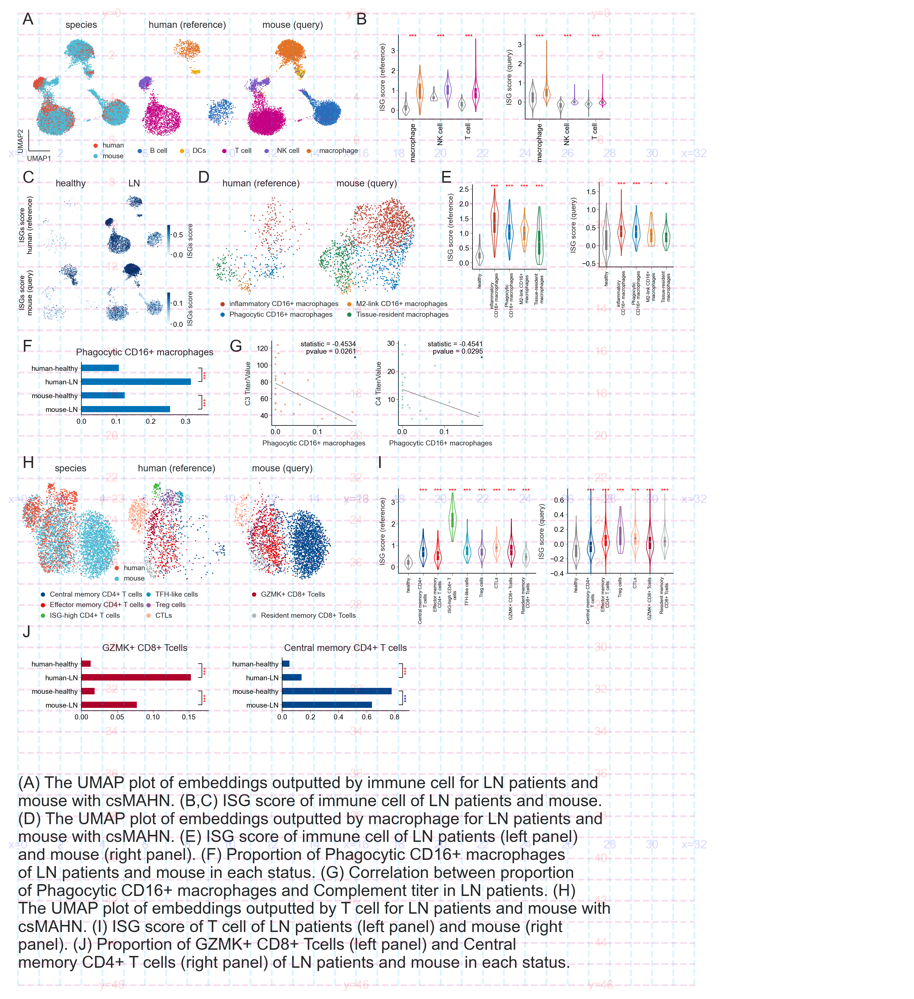

In [23]:
plt.close('all')
a4p = pl.figure.A4Page()
y = 1
# imm
with Block("UMAP imm", context=dict(x=.5, y=y, size=.5)) as context:
    ppara_func['legend_umap'](a4p, .5, 5.5)
    ax = a4p.add_ax(context.x, context.y, 5, 5)
    ut.sc.pl.umap(ppara_adata["imm_hm"], "sp", ax, cmap=ppara_cmap["sp"], size=context.size)
    ax.set_title("species")
    ax.set_rasterized(True)

    cmap = ppara_cmap['imm_cell_type']
    ax = a4p.add_ax(context.x + 5, context.y, 5, 5)
    ut.sc.pl.umap(ppara_adata["imm_ref"], "true_label", ax, cmap=cmap, size=context.size)
    ax.set_title("human (reference)")
    ax.set_rasterized(True)

    ax = a4p.add_ax(context.x + 10, context.y, 5, 5)
    ut.sc.pl.umap(ppara_adata["imm_que"], "model_label", ax, cmap=cmap, size=context.size)
    ax.set_title("mouse (query)")
    ax.set_rasterized(True)

    with Block("UMAP legend"):
        ax = a4p.add_ax(context.x + 3, context.y + 5, 1, 1)
        pl.cmap.show(ppara_cmap["sp"], fontdict=fontdict_default, ax=ax)

        a4p.area_update(context.x + 5, context.y + 5, 1, 5, 1.5, 1, gap_width=0.5)
        # a4p.area_show()
        for ax, keys in zip(
            a4p.area_yield_ax(),
            np.array_split(list(cmap.keys()), 5),
        ):
            pl.cmap.show(subset_dict(cmap, keys), ax=ax)
    del cmap

with Block("ISGs imm", context=dict(x=18, y=y, item='imm')) as context:
    # a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
    #                     fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict('ct', rotation=90, fontsize=6)
    )

    with Block("ref"):
        ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],

        )
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_xticks(ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)]['x'],
                      ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)].index)
        ax.set_ylabel("ISG score (reference)")
        ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
        del ax
    context.x += 6
    with Block("que"):
        ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_xticks(ppara_data['{}_Utest_score_ISGs_que'.format(context.item)]['x'],
                      ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].index)
        ax.set_ylabel("ISG score (query)")
        ax.set_ylim(-.9, 3.5)
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
        del ax
    del kw_func_plot
y += 7.5
with Block("umap ISGs imm", context=dict(x=1, y=y, size=.1)) as context:
    ppara = dict(gene='score_ISGs',kw_cbar=dict(format='{x:.1f}',label='ISGs score'))
    adata_ref = ut.sc.load_obsm_UMAP(ppara_adata['imm_ref'],'UMAP1,UMAP2'.split(','))
    adata_que = ut.sc.load_obsm_UMAP(ppara_adata['imm_que'],'UMAP1,UMAP2'.split(','))
    ax = a4p.add_ax(context.x-.6, context.y, 1, 3, rc=pl.rc_blank)
    ax.text(0, .5, 'ISGs score\nhuman (reference)', transform=ax.transAxes,
            fontdict=pl.tl_fontdict('cc', fontsize=6, rotation=90))

    with Block('ref'):
        ppara.update(kw_umap_gene=dict(size=context.size,cmap='Blues',vmax=.75, vmin=-.05))
        ax = ppara_func['ut_sc_umap_gene'](a4p, context.x+3, context.y, ut.sc.subset_adata(adata_ref,'status','LN'),
                                           draw_cbar=True,**ppara)
        ax.set_title('LN')
        lims = ax.get_xlim(),ax.get_ylim()
        ax = ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ut.sc.subset_adata(adata_ref,'status','healthy'),
                                           draw_cbar=False,**ppara)
        ax.set_title('healthy')
        ax.set_xlim(*lims[0]),ax.set_ylim(*lims[1])
    
    context.y += 3.2
    with Block('que'):
        ppara['kw_umap_gene'].update(vmax=.15, vmin=0)
        ax = a4p.add_ax(context.x-.6, context.y, 1, 3, rc=pl.rc_blank)
        ax.text(0, .5, 'ISGs score\nmouse (query)', transform=ax.transAxes,
                fontdict=pl.tl_fontdict('cc', fontsize=6, rotation=90))
        ax = ppara_func['ut_sc_umap_gene'](a4p, context.x+3, context.y, ut.sc.subset_adata(adata_que,'status','LN'),
                                      draw_cbar=True,**ppara)
        ax.set_title('')
        lims = ax.get_xlim(),ax.get_ylim()
        ax = ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ut.sc.subset_adata(adata_que,'status','healthy'),
                                      draw_cbar=False,**ppara)
        ax.set_title('')
        ax.set_xlim(*lims[0]),ax.set_ylim(*lims[1])
    del adata_ref,adata_que,ax
# mar
with Block("umap mar", context=dict(x=9, y=y, size=1)) as context:
    adata = ppara_adata['mar_hm']
    cmap = ppara_cmap['mar_cell_type']

    ax = a4p.add_ax(context.x, context.y, 5, 5)
    ut.sc.pl.umap(ut.sc.subset_adata(adata, 'dataset_type', 'ref'), 'true_label', size=context.size,
                  cmap=cmap, ax=ax)
    ax.set_title("human (reference)")
    ax.set_rasterized(True)

    ax = a4p.add_ax(context.x+5, context.y, 5, 5)
    ut.sc.pl.umap(ut.sc.subset_adata(adata, 'dataset_type', 'que'), 'pre_label', size=context.size,
                  cmap=cmap, ax=ax)
    ax.set_title("mouse (query)")
    ax.set_rasterized(True)

    # legend
    a4p.area_update(context.x+.5, context.y+5, 1, 2, 1, 1, gap_width=5)
    for ax, keys in zip(a4p.area_yield_ax(), np.array_split(list(cmap.keys()), 2)):
        pl.cmap.show(subset_dict(cmap, keys), ax=ax)
    del adata, cmap, keys, ax

with Block("ISGs mar", context=dict(x=21.5, y=y-.5)) as context:
    kw_func_plot = dict(
        cmap=ppara_cmap["mar_score_group_cell_type"],
        fontdict_xticks=pl.tl_fontdict("lt", rotation=90),
    )
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["mar_ref"].obs,
            order=ppara_data["mar_order_score_group_cell_type"],
        )
        ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (reference)")
        ax.set_xticklabels(pl.tl_str_next_line(kw_func_plot['order'], 10),
                           fontdict=pl.tl_fontdict('ct', rotation=90))
        # Utest marker
        ppara_data["mar_Utest_score_ISGs_ref"].apply(lambda row: ppara_func['pl_text_marker'](row, ax),
                                                     axis=1)
    context.x += 6

    with Block("que"):
        kw_func_plot.update(data=ppara_adata["mar_que"].obs,
                            order=ppara_data["mar_order_score_group_cell_type"])
        ax = a4p.add_ax(context.x, context.y, 3.5, 4, rc=pl.rc_frame)
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_ylim(-.6, 1.75)
        ax.set_ylabel("ISG score (query)")
        ax.set_xticklabels(pl.tl_str_next_line(kw_func_plot['order'], 10),
                           fontdict=pl.tl_fontdict('ct', rotation=90))
        # Utest marker
        ppara_data["mar_Utest_score_ISGs_que"].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)

y += 7
with Block("hbar mar", context=dict(x=3, y=y+1,
                                    item='Phagocytic CD16+ macrophages')) as context:
    df_plot = ppara_data['hm_mar_hbar'].loc[:, [context.item]].copy()
    row_stat = ppara_data['chi_mar'].loc[context.item,:]
    cmap = ppara_cmap['mar_cell_type']
    ppara = dict(gap_between_group=0, width_one_bar=1,
                width_ratio=2, to_horizontal=True)
    ax = a4p.add_ax(context.x, context.y, 6, 2.5, rc=pl.rc_frame)
    for i, (k) in enumerate(df_plot.columns):
        pl.bar(ax, df_plot, key_height=k, cmap=cmap, bottom=0,
               group_counts=df_plot.shape[0], ngroup=i, **ppara)
    pl.bar_add_ticks(ax, df_plot, group_counts=4, offset=-1.5,
                     fontdict=dict(fontsize=6), **ppara)
    ax.set_title(context.item)
    pl.tl_expand_ax(ax)
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[0,4],'m')
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[8,12],'h')

    del df_plot,row_stat,cmap,ppara,ax

with Block("spearmanr clinical_ref", context=dict(x=12, y=y,
                                                  k1='Phagocytic CD16+ macrophages',
                                                  k2='1b. C3 Titer/Value')) as context:
    ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
    df_plot = ppara_data['clinical_ref']
    ppara_func['linear_correlation'](ax, df_plot, context.k1, context.k2,
                                     kw_scatter=dict(c='#F39B7F'),kw_plot=dict(c='grey'))
    ax.set_ylabel(' '.join(context.k2.split(' ')[1:]))
with Block("spearmanr clinical_ref", context=dict(x=18, y=y,
                                                  k1='Phagocytic CD16+ macrophages',
                                                  k2='2b. C4 Titer/Value')) as context:
    ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
    df_plot = ppara_data['clinical_ref']
    ppara_func['linear_correlation'](ax, df_plot, context.k1, context.k2,
                                    kw_scatter=dict(c='#91D1C2'),kw_plot=dict(c='grey'))
    ax.set_ylabel(' '.join(context.k2.split(' ')[1:]))
y += 6.5
# T
with Block("UMAP T", context=dict(x=0, y=y, size=1)) as context:
    ax = a4p.add_ax(context.x, context.y, 5, 5)
    ut.sc.pl.umap(
        ppara_adata["T_hm"], "sp", ax, cmap=ppara_cmap["sp"], size=context.size
    ), ax.set_title("species")
    ax.set_rasterized(True)

    cmap = ppara_cmap['T_cell_type']

    ax = a4p.add_ax(context.x + 5, context.y, 5, 5)
    ut.sc.pl.umap(ppara_adata["T_ref"], "model_label", ax, cmap=cmap, size=context.size,)
    ax.set_title("human (reference)")
    ax.set_rasterized(True)

    ax = a4p.add_ax(context.x + 10, context.y, 5, 5)
    ut.sc.pl.umap(ppara_adata["T_que"], 'model_label', ax, cmap=cmap, size=context.size)
    ax.set_title("mouse (query)")
    ax.set_rasterized(True)

    with Block("UMAP legend"):
        ax = a4p.add_ax(context.x + 4.5, context.y + 4, 1, 1)
        pl.cmap.show(ppara_cmap["sp"], fontdict=fontdict_default, ax=ax)

        a4p.area_update(context.x+1, context.y + 5, 1, 3, 1, 2, gap_width=4)
        # a4p.area_show()
        for ax, keys in zip(
            a4p.area_yield_ax(rc=pl.rc_blank),
            ut.arr.yield_ele_by_count(
                list(cmap.keys()), [3, 3, 3]
            ),
        ):
            pl.cmap.show(subset_dict(cmap, keys), ax=ax)

with Block("ISGs T", context=dict(x=18, y=y+.5, item='T')) as context:
    # a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
    #                     fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict('rt', rotation=90, fontsize=6))
    with Block("ref"):
        ax = a4p.add_ax(context.x, context.y, 6.5, 4, rc=pl.rc_frame)
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],

        )
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_xticks(np.arange(len(kw_func_plot['order'])), pl.tl_str_next_line(kw_func_plot['order'], 15),
                      fontdict=pl.tl_fontdict('ct', rotation=90, fontsize=4))
        ax.set_ylabel("ISG score (reference)")
        ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
        del ax
    context.x += 8
    with Block("que"):
        order = pd.Series(ppara_data['T_order_score_group_cell_type'].copy())
        order = order[order.isin(ppara_adata['T_que'].obs['model_label'])].to_list()

        ax = a4p.add_ax(context.x, context.y, 5, 4, rc=pl.rc_frame)
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=['healthy'] + order)
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_xticks(np.arange(len(kw_func_plot['order'])), pl.tl_str_next_line(kw_func_plot['order'], 15),
                      fontdict=pl.tl_fontdict('ct', rotation=90, fontsize=4))
        ax.set_ylabel("ISG score (query)")
        ax.set_ylim(-.4, .75)
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
    del kw_func_plot, order
y += 8.5
with Block("hbar T", context=dict(x=3, y=y,
                                    item='GZMK+ CD8+ Tcells')) as context:
    df_plot = ppara_data['hm_T_hbar'].loc[:, [context.item]].copy()
    row_stat = ppara_data['chi_T'].loc[context.item,:]
    cmap = ppara_cmap['T_cell_type']
    ppara = dict(gap_between_group=0, width_one_bar=1,
                width_ratio=2, to_horizontal=True)
    ax = a4p.add_ax(context.x, context.y, 6, 2.5, rc=pl.rc_frame)
    for i, (k) in enumerate(df_plot.columns):
        pl.bar(ax, df_plot, key_height=k, cmap=cmap, bottom=0,
               group_counts=df_plot.shape[0], ngroup=i, **ppara)
    pl.bar_add_ticks(ax, df_plot, group_counts=4, offset=-1.5,
                     fontdict=dict(fontsize=6), **ppara)
    ax.set_title(context.item)
    pl.tl_expand_ax(ax)
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[0,4],'m')
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[8,12],'h')
    del df_plot,row_stat,cmap,ppara,ax
with Block("hbar T", context=dict(x=12.5, y=y,
                                    item='Central memory CD4+ T cells')) as context:
    df_plot = ppara_data['hm_T_hbar'].loc[:, [context.item]].copy()
    row_stat = ppara_data['chi_T'].loc[context.item,:]
    cmap = ppara_cmap['T_cell_type']
    ppara = dict(gap_between_group=0, width_one_bar=1,
                width_ratio=2, to_horizontal=True)
    ax = a4p.add_ax(context.x, context.y, 6, 2.5, rc=pl.rc_frame)
    for i, (k) in enumerate(df_plot.columns):
        pl.bar(ax, df_plot, key_height=k, cmap=cmap, bottom=0,
               group_counts=df_plot.shape[0], ngroup=i, **ppara)
    pl.bar_add_ticks(ax, df_plot, group_counts=4, offset=-1.5,
                     fontdict=dict(fontsize=6), **ppara)
    ax.set_title(context.item)
    pl.tl_expand_ax(ax)
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[0,4],'m')
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[8,12],'h')
    del df_plot,row_stat,cmap,ppara,ax

with Block('text'):
    for text, (x, y) in zip(
        [chr(65+i) for i in range(26)],
            np.array([
                [.2, .5], [16, .5], [.2, 8], [8.5, 8],  # ABCD
                [20, 8], [.2, 16],[10, 16], [.2, 21.5],   # EFGH
                [17, 21.5],[.2, 29.5]                     # IJKL
            ])):
        a4p.add_text_with_ax(
            a4p.add_ax(x, y), text)

pl.tl_savefig(a4p.fig,'{}_{}.svg'.format(item, model),p_pdf)
pl.tl_savefig(a4p.fig, "{}_{}.png".format(item, model), p_pdf)

with Block('note'):
    text = "(A) The UMAP plot of embeddings outputted by immune cell for LN patients and mouse with csMAHN. \
(B,C) ISG score of immune cell of LN patients and mouse. \
(D) The UMAP plot of embeddings outputted by macrophage for LN patients and mouse with csMAHN. \
(E) ISG score of immune cell of LN patients (left panel) and mouse (right panel). \
(F) Proportion of Phagocytic CD16+ macrophages of LN patients and mouse in each status. \
(G) Correlation between proportion of Phagocytic CD16+ macrophages and Complement titer in LN patients. \
(H) The UMAP plot of embeddings outputted by T cell for LN patients and mouse with csMAHN. \
(I) ISG score of T cell of LN patients (left panel) and mouse (right panel). \
(J) Proportion of GZMK+ CD8+ Tcells (left panel) and Central memory CD4+ T cells (right panel) of LN patients and mouse in each status. \
"
    text = pl.tl_str_next_line(text,75,' ')
    a4p.add_text_with_ax(a4p.add_ax(0, 45, 42),text, 0, 0)
    print("{1}\n{0}\n{1}".format(text, '*'*75))
    del text

a4p.save_as_pdf(p_pdf.joinpath('{}_{}.pdf'.format(item, model)))

a4p.add_grid()
a4p.fig

## supp

[Waring] index not in df : ISG-high CD4+ T cells,TFH-like cells
[Waring] index not in df : ISG-high CD4+ T cells,TFH-like cells
[out][plot] LN_csMAHN_supp1.svg 
	in /public/workspace/licanchengup/link/res_publish/plot/pdf
[out][plot] LN_csMAHN_supp1.png 
	in /public/workspace/licanchengup/link/res_publish/plot/pdf


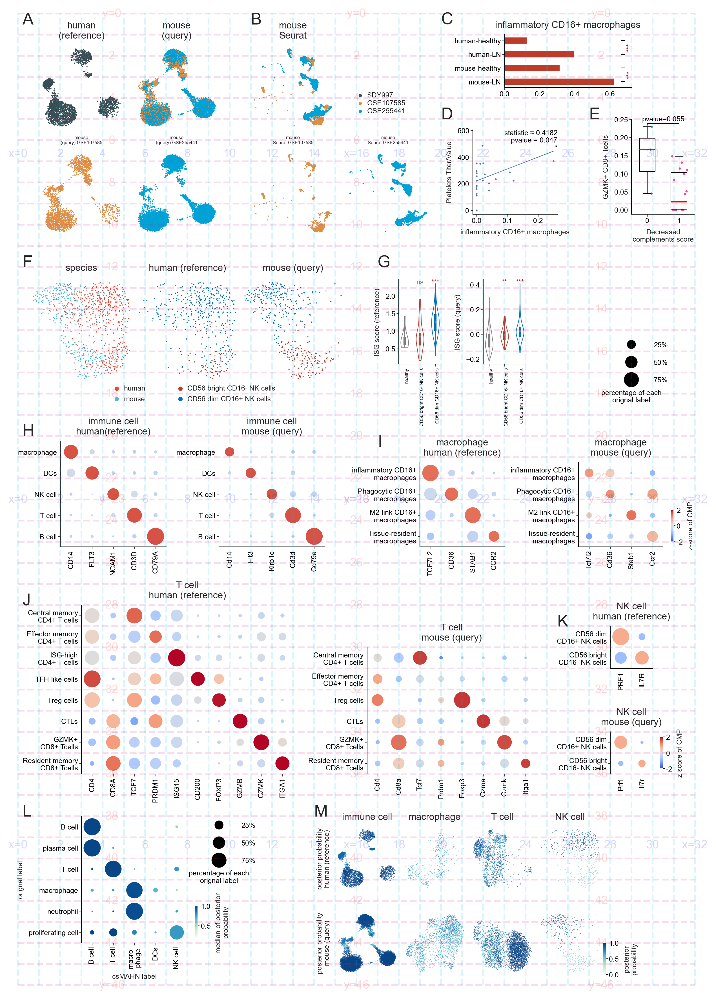

***************************************************************************
(A) The UMAP plot of embeddings outputted by immune cell for LN patients and
mouse with csMAHN, colored with dataset. (B) UMAP plot of LN mouse clsuted
with Seurata and colored with dataset. (C) Proportion of inflammatory CD16+
macrophages of LN patients and mouse in each status. (D) Correlation between
proportion of inflammatory CD16+ macrophages and platelets titer in LN
patients. (E) Box plot of GZMK+ CD8+ Tcells proportion, group by Decreased
complements score. (F) The UMAP plot of embeddings outputted by NK cell for
LN patients and mouse with csMAHN. (G) ISG score of NK cell of LN patients
(left panel) and mouse (right panel). Dot plot showing scaled gene expression
levels of immnue cell (H), macrophages (I), T cell (J), and NK cell (K)
The size of the dots corresponds to the proportion of each csMAHN label. (L)
Dot plot showing posterior probability of the immune cell integrating human
and mouse LN immune

In [24]:
plt.close("all")
a4p = pl.figure.A4Page()
y = 1.5

with Block("umap status imm", context=dict(x=1, y=y, size=1, item='imm', key='dataset_id',
                                           cmap=ppara_cmap['dataset_id'])) as context:
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    

    context.x += 10
    adata = ut.sc.load_obsm_UMAP(
        adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat')
    
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+5, context.y+2, 1, 1.5), size=20)
    
    context.y += 5
    context.x = 1
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 10
    with Block("umap status Seurat without harmony"):
        adata = ut.sc.load_obsm_UMAP(
            adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata_que.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\nSeurat {}'.format(status), fontsize=4)
    del adata, adata_ref, adata_que, ax, status

with Block("hbar mar", context=dict(x=23, y=y-.5,
                                    item='inflammatory CD16+ macrophages')) as context:
    df_plot = ppara_data['hm_mar_hbar'].loc[:, [context.item]].copy()
    row_stat = ppara_data['chi_mar'].loc[context.item,:]
    cmap = ppara_cmap['mar_cell_type']
    ppara = dict(gap_between_group=0, width_one_bar=1,
                width_ratio=2, to_horizontal=True)
    ax = a4p.add_ax(context.x, context.y, 6, 2.5, rc=pl.rc_frame)
    for i, (k) in enumerate(df_plot.columns):
        pl.bar(ax, df_plot, key_height=k, cmap=cmap, bottom=0,
               group_counts=df_plot.shape[0], ngroup=i, **ppara)
    pl.bar_add_ticks(ax, df_plot, group_counts=4, offset=-1.5,
                     fontdict=dict(fontsize=6), **ppara)
    ax.set_title(context.item)
    pl.tl_expand_ax(ax)
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[0,4],'m')
    ppara_func['chi_hbar_stats_bar'](ax,row_stat,[8,12],'h')

    del df_plot,row_stat,cmap,ppara,ax

with Block("spearmanr clinical_ref", context=dict(x=21.5, y=y+4,
                                                  k1='inflammatory CD16+ macrophages',
                                                  k2='4b. Platelets Titer/Value')) as context:
    ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
    df_plot = ppara_data['clinical_ref']
    ppara_func['linear_correlation'](ax, df_plot, context.k1, context.k2)
    ax.set_ylabel(' '.join(context.k2.split(' ')[1:]))
with Block("box Decreased complements score", context=dict(x=29, y=y+3.5)) as context:
    def handle_func(ax, data, k1, k2):
        data = data.loc[:, [k1, k2]].copy()
        data = data.dropna(axis=0)
        data[k2] = data[k2].astype(int).astype(str)
        order = ['0', '1']
        for i, (df_item, c) in enumerate(zip(ut.df.group_yield(
                data, k2, keys_value=k1, order=order), '#7876B1,#EE4C97'.split(','))):
            # display(df_item)
            pl.boxplot(df_item, ax, positions=i)
            ax.scatter(i+pl.tl_jitter(df_item.shape[0], .5), df_item[k1], s=2, c=c)
        res_stats = ut.sc.scipy.stats.mannwhitneyu(*ut.df.group_yield(data, k2, keys_value=k1))
        pl.tl_stats_bar(ax, [0, 1], top=.99, bottom=.97,
                        text='pvalue={:.3f}'.format(res_stats.pvalue[0]),
                        fontdict=pl.tl_fontdict('cb'))
        ax.set_xticklabels(order)
        ax.set_ylabel(k1)
        ax.set_xlabel(k2)

    ax = a4p.add_ax(context.x, context.y, 3, 4.5, rc=pl.rc_frame)
    df_plot = ppara_data['clinical_ref']
    handle_func(ax, df_plot, 'GZMK+ CD8+ Tcells', '5. Decreased complements score')
    ax.set_xlabel('Decreased\ncomplements score')
    del handle_func

y += 11
with Block("umap NK", context=dict(x=.5, y=y, size=1)) as context:
    # a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 2, 1), 'NK',
    #                      fontdict=pl.tl_fontdict('cc', fontsize=context.size))

    adata = ppara_adata['NK_hm']
    ax = a4p.add_ax(context.x, context.y, 5, 5)
    ut.sc.pl.umap(adata, 'sp', size=context.size,
                  cmap=ppara_cmap['sp'], ax=ax)
    ax.set_title("species")
    ax.set_rasterized(True)
    pl.cmap.show(ppara_cmap['sp'], ax=a4p.add_ax(context.x+4, context.y+5))

    cmap = ppara_cmap['NK_cell_type']
    ax = a4p.add_ax(context.x+5, context.y, 5, 5)
    ut.sc.pl.umap(ut.sc.subset_adata(adata, 'dataset_type', 'ref'), 'true_label', size=context.size,
                  cmap=cmap, ax=ax)
    ax.set_title("human (reference)")
    ax.set_rasterized(True)

    ax = a4p.add_ax(context.x+10, context.y, 5, 5)
    ut.sc.pl.umap(ut.sc.subset_adata(adata, 'dataset_type', 'que'), 'pre_label', size=context.size,
                  cmap=cmap, ax=ax)
    ax.set_title("mouse (query)")
    ax.set_rasterized(True)

    # legend
    pl.cmap.show(cmap, ax=a4p.add_ax(context.x+7, context.y+5, 1, 1))

    del adata, cmap

with Block("ISGs NK", context=dict(x=18, y=y)) as context:
    kw_func_plot = dict(
        cmap=ppara_cmap["NK_score_group_cell_type"],
        fontdict_xticks=pl.tl_fontdict("lt", rotation=90),
    )
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["NK_ref"].obs,
            order=ppara_data["NK_order_score_group_cell_type"],
        )
        ax = a4p.add_ax(context.x, context.y + 0.1, 2, 4, rc=pl.rc_frame)
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (reference)")
        # Utest NKker
        ppara_data["NK_Utest_score_ISGs_ref"].apply(lambda row: ppara_func['pl_text_marker'](row, ax),
                                                    axis=1)
    context.x += 4
    with Block("que"):
        kw_func_plot.update(
            data=ppara_adata["NK_que"].obs,
            order=ppara_data["NK_order_score_group_cell_type"],
        )
        ax = a4p.add_ax(context.x, context.y + 0.1, 2, 4, rc=pl.rc_frame)
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (query)")
        # Utest NKker
        ppara_data["NK_Utest_score_ISGs_que"].apply(lambda row: ppara_func['pl_text_marker'](row, ax),
                                                    axis=1)
    del kw_func_plot, ax

y += 7.75
with Block("marker imm", context=dict(x=2, y=y, cmap='coolwarm', item='imm')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=list(ppara_data['order_cell_type'].keys()),
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('immune cell\nhuman(reference)')
    context.x += len(ppara['genes']) + 2.5
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label',
                     order=list(ppara_data['order_cell_type'].keys()))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('immune cell\nmouse (query)')
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    # cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    # cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
    
    del ppara, cbar, ax, kw_cbar

with Block("marker mar", context=dict(x=19, y=y+1, cmap='coolwarm', item='mar')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=ppara_data['order_cell_type']['macrophage'],
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('macrophage\nhuman (reference)')
        ax.set_yticklabels([i.get_text().replace(' macrophages','\nmacrophages') for i in ax.get_yticklabels()])
    context.x += len(ppara['genes']) + 3.5
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label')
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('macrophage\nmouse (query)')
        ax.set_yticklabels([i.get_text().replace(' macrophages','\nmacrophages') for i in ax.get_yticklabels()])
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
    
    del ppara, cbar, ax, kw_cbar

with Block('legend percentage', context=dict(x=28, y=y - 5)) as context:
    ax = a4p.add_ax(context.x, context.y, 2, 2.5, rc=pl.tl_rc(pl.rc_blank,
                                                              {'ytick.labelright': True, 'xtick.labelbottom': True}))
    dotplot_marker_legend(ax=ax, draw_cbar=False)
    ax.set_xticklabels(['percentage of each\norignal label'])

y += 6.75
with Block("marker T", context=dict(x=3, y=y+1, cmap='coolwarm', item='T')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=ppara_data['order_cell_type']['T cell'],
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('T cell\nhuman (reference)')
        ax.set_yticklabels([i.get_text().replace(' CD4+','\nCD4+').replace(' CD8+','\nCD8+')
                            for i in ax.get_yticklabels()])
    context.x += len(ppara['genes']) + 3.5
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label')
        ax = a4p.add_ax(context.x, context.y+2, len(ppara['genes']), len(ppara['order'])-2, rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('T cell\nmouse (query)')
        ax.set_yticklabels([i.get_text().replace(' CD4+','\nCD4+').replace(' CD8+','\nCD8+')
                            for i in ax.get_yticklabels()])
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    # cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    # cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
    del ppara, cbar, ax, kw_cbar

with Block("marker NK", context=dict(x=28, y=y+2, cmap='coolwarm', item='NK')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=ppara_data['order_cell_type']['NK cell'],
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('NK cell\nhuman (reference)')
        ax.set_yticklabels([i.get_text().replace(' CD16','\nCD16')
                            for i in ax.get_yticklabels()])
    # context.x += len(ppara['genes']) + 3.5
    context.y += len(ppara['order']) + 3
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label')
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('NK cell\nmouse (query)')
        ax.set_yticklabels([i.get_text().replace(' CD16','\nCD16')
                            for i in ax.get_yticklabels()])
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
    del ppara, cbar, ax, kw_cbar

y += 11
with Block('posterior probability imm', context=dict(x=3, y=y, cmap='GnBu')) as context:
    kw_cbar=dict(format='{x:.1f}', aspect=10,label='median of posterior \nprobability')
    ppara = dict(
        data=ppara_adata['imm_hm'].obs.query("dataset_type == 'que' "),
        kw_bubble=dict(vmax=1, vmin=0.2, cmap=context.cmap,fontdict_xtick=dict(rotation=90)),
        order_row='B cell,plasma cell,T cell,macrophage,neutrophil,proliferating cell'.split(','),
        order_col='B cell,T cell,macrophage,DCs,NK cell'.split(','))
    ax = a4p.add_ax(context.x, context.y, 5, 6, rc=pl.rc_frame)
    cbar = dotplot_max_prob_median(ax=ax, **ppara)
    ax.set_ylabel('orignal label')
    ax.set_xlabel('csMAHN label')
    ax.set_xticklabels([i.get_text().replace('phage','-\nphage') for i in ax.get_xticklabels()])
    ax = a4p.add_ax(context.x+4.5, context.y+4, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')

    
    with Block('legend percentage'):
        ax = a4p.add_ax(context.x+5.5, context.y, 2, 2.5, rc=pl.tl_rc(pl.rc_blank,
                {'ytick.labelright': True, 'xtick.labelbottom': True}))
        dotplot_marker_legend(ax=ax, draw_cbar=False)
        ax.set_xticklabels(['percentage of each\norignal label'])
    del ppara, ax, cbar, kw_cbar

with Block("umap ISGs imm", context=dict(x=15, y=y+.5,cmap='GnBu',size=.1)) as context:
    kw_umap_gene=dict(size=context.size,cmap=context.cmap, vmax=1, vmin=0)
    ppara = dict(gene='max_prob',draw_cbar=False,
                 kw_umap_gene=kw_umap_gene,
                 kw_cbar=dict(format='{x:.1f}',label= 'posterior\nprobability'))
    df_area = ut.df.product_seq(['imm,mar,T,NK'.split(','),'ref,que'.split(',')],
                                names='item,type'.split(','))
    df_area['title'] = df_area['item'].map({k:v for k,v in zip('imm,mar,T,NK'.split(','),
        'immune cell,macrophage,T cell,NK cell'.split(','))})
    

    a4p.add_ax(context.x,context.y,1,3,rc=pl.rc_blank).set_ylabel('posterior probability\nhuman (reference)')
    a4p.add_ax(context.x,context.y+4,1,3,rc=pl.rc_blank).set_ylabel('posterior probability\nmouse (query)')
    
    a4p.area_update(context.x,context.y,2,4,3,3,gap_width=.2,gap_height=1)
    for i,row in df_area.iterrows():
        if i == df_area.shape[0]-1:
            ppara.update(draw_cbar=True)
        else:
            ppara.update(draw_cbar=False)
        adata = ut.sc.load_obsm_UMAP(ppara_adata['{item}_{type}'.format(**row)],'UMAP1,UMAP2'.split(','))
        ppara.update(adata = adata)
        area_x,area_y,ax = a4p.area_get_ax(index=i,order='F',with_xy=True,rc=pl.rc_blank)
        ax = ppara_func['ut_sc_umap_gene'](a4p,area_x,area_y,**ppara)
        ax.set_title(row['title']) if i%2 == 0 else ax.set_title('')
    del kw_umap_gene,ppara,df_area,i,row


with Block('text'):
    for text, (x, y) in zip(
        [chr(65+i) for i in range(26)],np.array([
                [.2, .5], [11, .5], [20, .5], [20,5],  # ABCD
                [27, 5],[.2, 12],[17, 12],[.2,20],     # EFGH
                [17,20.5],[.2,28],[25.5,29],[.2,38], # IJKL
                [14,38]                                # MNOP
            ])):
        a4p.add_text_with_ax(a4p.add_ax(x, y), text)

pl.tl_savefig(a4p.fig,'{}_{}_supp1.svg'.format(item, model),p_pdf)
pl.tl_savefig(a4p.fig, "{}_{}_supp1.png".format(item, model), p_pdf)

a4p.save_as_pdf(p_pdf.joinpath('{}_{}_supp1.pdf'.format(item, model)))


a4p.add_grid()
display(a4p.fig)

plt.close("all")
a4p = pl.figure.A4Page()

with Block('note'):
    text = "(A) The UMAP plot of embeddings outputted by immune cell for LN patients and mouse with csMAHN, colored with dataset. \
(B) UMAP plot of LN mouse clsuted with Seurata and colored with dataset. \
(C) Proportion of inflammatory CD16+ macrophages of LN patients and mouse in each status. \
(D) Correlation between proportion of inflammatory CD16+ macrophages and platelets titer in LN patients. \
(E) Box plot of GZMK+ CD8+ Tcells proportion, group by Decreased complements score. \
(F) The UMAP plot of embeddings outputted by NK cell for LN patients and mouse with csMAHN. \
(G) ISG score of NK cell of LN patients (left panel) and mouse (right panel). \
Dot plot showing scaled gene expression levels of immnue cell (H), macrophages (I), T cell (J), and NK cell (K) \
The size of the dots corresponds to the proportion of each csMAHN label. \
(L) Dot plot showing posterior probability of the immune cell integrating human and mouse LN immune cells using csMAHN, \
The size of the dots corresponds to the proportion of each original label that is assigned to each csMAHN label. \
(M) UMAP plot human and mouse LN immune cells, macrophages, T cell, and NK cell, colored with posterior probability integrating with csMAHN. \
"
    text = pl.tl_str_next_line(text,75,' ')
    a4p.add_text_with_ax(a4p.add_ax(0, 45, 42),text, 0, 0)
    print("{1}\n{0}\n{1}".format(text, '*'*75))
    del text
a4p.save_as_pdf(p_pdf.joinpath('{}_{}_supp2.pdf'.format(item, model)))

# draft

## marker

[Waring] index not in df : ISG-high CD4+ T cells,TFH-like cells
[Waring] index not in df : ISG-high CD4+ T cells,TFH-like cells


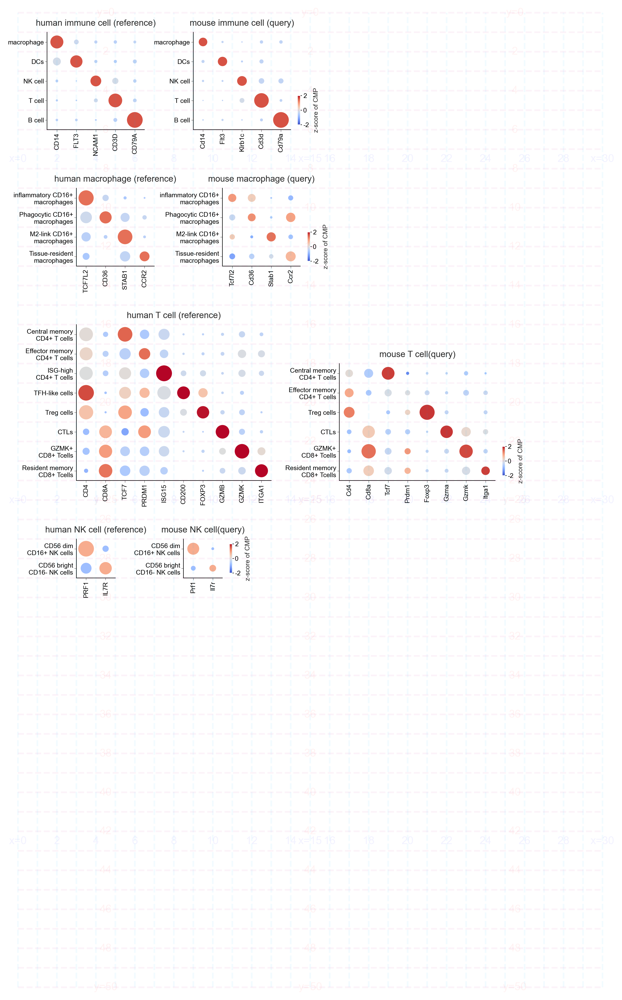

In [25]:
plt.close("all")
a4p = pl.figure.DrawingBoard(ncols=30, nrows=50)
y = 1
with Block("marker imm", context=dict(x=1.5, y=y, cmap='coolwarm', item='imm')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=list(ppara_data['order_cell_type'].keys()),
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('human immune cell (reference)')
    context.x += len(ppara['genes']) + 2.5
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label',
                     order=list(ppara_data['order_cell_type'].keys()))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('mouse immune cell (query)')
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
    
    del ppara, cbar, ax, kw_cbar
y += 7
with Block("marker mar", context=dict(x=3, y=y+1, cmap='coolwarm', item='mar')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=ppara_data['order_cell_type']['macrophage'],
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('human macrophage (reference)')
        ax.set_yticklabels([i.get_text().replace(' macrophages','\nmacrophages') for i in ax.get_yticklabels()])
    context.x += len(ppara['genes']) + 3.5
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label')
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('mouse macrophage (query)')
        ax.set_yticklabels([i.get_text().replace(' macrophages','\nmacrophages') for i in ax.get_yticklabels()])
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
    
    del ppara, cbar, ax, kw_cbar
y += 7
with Block("marker T", context=dict(x=3, y=y+1, cmap='coolwarm', item='T')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=ppara_data['order_cell_type']['T cell'],
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('human T cell (reference)')
        ax.set_yticklabels([i.get_text().replace(' CD4+','\nCD4+').replace(' CD8+','\nCD8+')
                            for i in ax.get_yticklabels()])
    context.x += len(ppara['genes']) + 3.5
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label')
        ax = a4p.add_ax(context.x, context.y+2, len(ppara['genes']), len(ppara['order'])-2, rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('mouse T cell(query)')
        ax.set_yticklabels([i.get_text().replace(' CD4+','\nCD4+').replace(' CD8+','\nCD8+')
                            for i in ax.get_yticklabels()])
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
y += 11
with Block("marker NK", context=dict(x=3, y=y+1, cmap='coolwarm', item='NK')) as context:
    kw_cbar=dict(format='{x:.0f}', aspect=10, label='z-score of CMP')
    with Block('ref'):
        ppara = dict(adata=ppara_adata['{}_ref'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['ref'],
                     key_group='model_label',
                     order=ppara_data['order_cell_type']['NK cell'],
                     kw_bubble=dict(vmax=2.5, vmin=-2.5, cmap=context.cmap))
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('human NK cell (reference)')
        ax.set_yticklabels([i.get_text().replace(' CD16','\nCD16')
                            for i in ax.get_yticklabels()])
    context.x += len(ppara['genes']) + 3.5
    with Block('que'):
        ppara.update(adata=ppara_adata['{}_que'.format(context.item)],
                     genes=ppara_data['marker_{}'.format(context.item)]['que'],
                     key_group='model_label')
        ax = a4p.add_ax(context.x, context.y, len(ppara['genes']), len(ppara['order']), rc=pl.rc_frame)
        cbar = dotplot_marker(ax=ax, layer=None, **ppara)
        ax.set_title('mouse NK cell(query)')
        ax.set_yticklabels([i.get_text().replace(' CD16','\nCD16')
                            for i in ax.get_yticklabels()])
    ax = a4p.add_ax(context.x+len(ppara['genes']) -.5, context.y+len(ppara['order'])-2, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
a4p.add_grid(alpha=.05)

## batch_effect

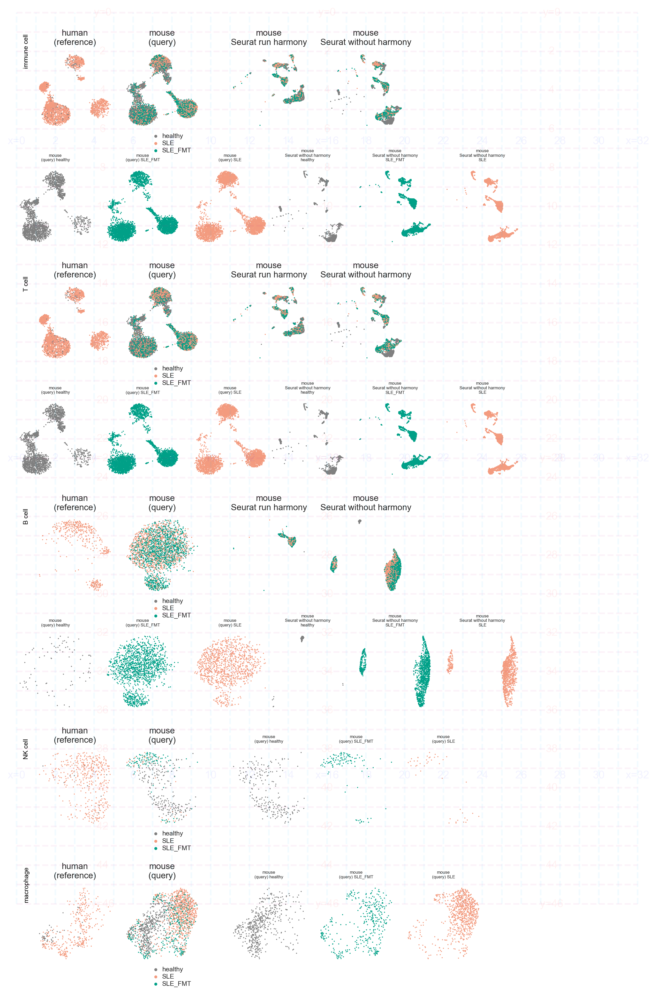

In [26]:
plt.close("all")
a4p = pl.figure.A4Page()
y = 2
with Block("umap status imm", context=dict(x=1, y=y, size=1, item='imm', key='preobs_status',
                                           cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'immune cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    adata = ut.sc.load_obsm_UMAP(adata_que, 'preobs_UMAP1,preobs_UMAP2'.split(','))
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat run harmony')
    context.x += 5

    adata = ut.sc.load_obsm_UMAP(
        adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat without harmony')

    context.y += 6
    context.x = 0
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13
    with Block("umap status Seurat without harmony"):
        adata = ut.sc.load_obsm_UMAP(
            adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata_que.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\nSeurat without harmony\n{}'.format(status), fontsize=4)
    del adata, adata_ref, adata_que, ax, status
y += 12
with Block("umap status T", context=dict(x=1, y=y, size=1, item='imm', key='preobs_status',
                                         cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'T cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    adata = ut.sc.load_obsm_UMAP(adata_que, 'preobs_UMAP1,preobs_UMAP2'.split(','))
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat run harmony')
    context.x += 5

    adata = ut.sc.load_obsm_UMAP(
        adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat without harmony')

    context.y += 6
    context.x = 0
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13
    with Block("umap status Seurat without harmony"):
        adata = ut.sc.load_obsm_UMAP(
            adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata_que.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\nSeurat without harmony\n{}'.format(status), fontsize=4)
    del adata, adata_ref, adata_que, ax, status
y += 12
with Block("umap status B", context=dict(x=1, y=y, size=1, item='B', key='preobs_status',
                                         cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'B cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    adata = ut.sc.load_obsm_UMAP(adata_que, 'preobs_UMAP1,preobs_UMAP2'.split(','))
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat run harmony')
    context.x += 5

    adata = ut.sc.load_obsm_UMAP(
        adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat without harmony')

    context.y += 6
    context.x = 0
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13
    with Block("umap status Seurat without harmony"):
        adata = ut.sc.load_obsm_UMAP(
            adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata_que.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\nSeurat without harmony\n{}'.format(status), fontsize=4)
    del adata, adata_ref, adata_que, ax, status
y += 12
with Block("umap status NK", context=dict(x=1, y=y, size=1, item='NK', key='preobs_status',
                                          cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'NK cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13

    del adata, adata_ref, adata_que, ax, status
y += 7
with Block("umap status mar", context=dict(x=1, y=y, size=1, item='mar', key='preobs_status',
                                           cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'macrophage',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13

    del adata, adata_ref, adata_que, ax, status
# pl.tl_savefig(a4p.fig,'{}_{}_batch_effect_1.svg'.format(item, model),p_pdf)
# pl.tl_savefig(a4p.fig, "{}_{}_batch_effect_1.png".format(item, model), p_pdf)
# a4p.save_as_pdf(p_pdf.joinpath('{}_{}_batch_effect_1.pdf'.format(item, model)))
a4p.add_grid(alpha=.05)

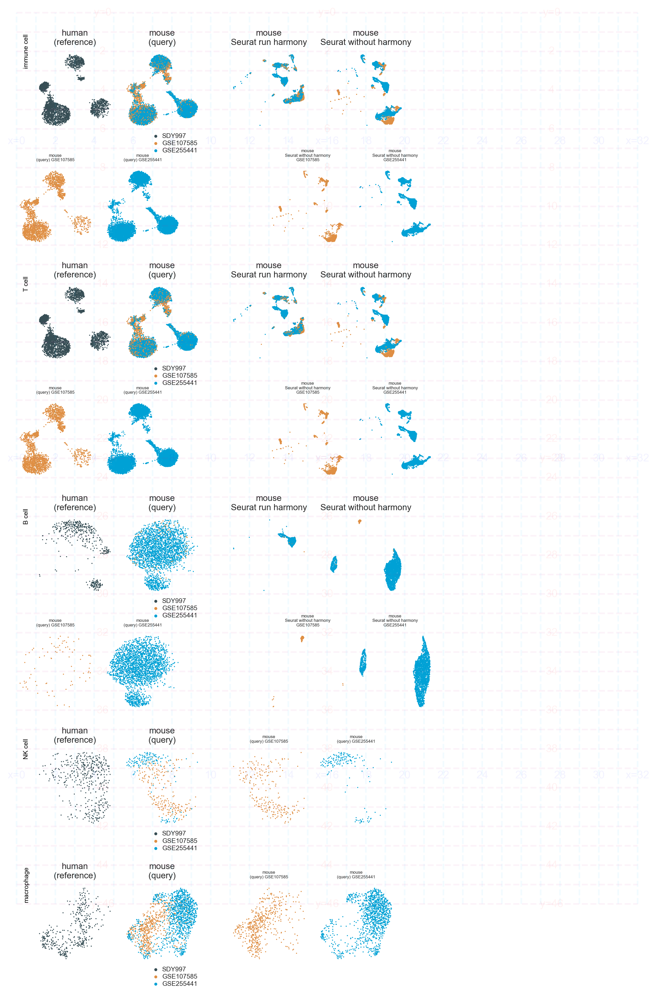

In [27]:
plt.close("all")
a4p = pl.figure.A4Page()
y = 2
with Block("umap status imm", context=dict(x=1, y=y, size=1, item='imm', key='dataset_id',
                                           cmap=ppara_cmap['dataset_id'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'immune cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    adata = ut.sc.load_obsm_UMAP(adata_que, 'preobs_UMAP1,preobs_UMAP2'.split(','))
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat run harmony')
    context.x += 5

    adata = ut.sc.load_obsm_UMAP(
        adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat without harmony')

    context.y += 6
    context.x = 0
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13
    with Block("umap status Seurat without harmony"):
        adata = ut.sc.load_obsm_UMAP(
            adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata_que.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\nSeurat without harmony\n{}'.format(status), fontsize=4)
    del adata, adata_ref, adata_que, ax, status
y += 12
with Block("umap status T", context=dict(x=1, y=y, size=1, item='imm', key='dataset_id',
                                         cmap=ppara_cmap['dataset_id'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'T cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    adata = ut.sc.load_obsm_UMAP(adata_que, 'preobs_UMAP1,preobs_UMAP2'.split(','))
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat run harmony')
    context.x += 5

    adata = ut.sc.load_obsm_UMAP(
        adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat without harmony')

    context.y += 6
    context.x = 0
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13
    with Block("umap status Seurat without harmony"):
        adata = ut.sc.load_obsm_UMAP(
            adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata_que.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\nSeurat without harmony\n{}'.format(status), fontsize=4)
    del adata, adata_ref, adata_que, ax, status
y += 12
with Block("umap status B", context=dict(x=1, y=y, size=1, item='B', key='dataset_id',
                                         cmap=ppara_cmap['dataset_id'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'B cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    adata = ut.sc.load_obsm_UMAP(adata_que, 'preobs_UMAP1,preobs_UMAP2'.split(','))
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat run harmony')
    context.x += 5

    adata = ut.sc.load_obsm_UMAP(
        adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
    ax = a4p.add_ax(context.x, context.y, 4, 4)
    ut.sc.pl.umap(adata, context.key, ax=ax, size=context.size, cmap=context.cmap)
    ax.set_rasterized(True)
    ax.set_title('mouse\nSeurat without harmony')

    context.y += 6
    context.x = 0
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13
    with Block("umap status Seurat without harmony"):
        adata = ut.sc.load_obsm_UMAP(
            adata_que, 'without_harmony_UMAP1,without_harmony_UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata_que.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\nSeurat without harmony\n{}'.format(status), fontsize=4)
    del adata, adata_ref, adata_que, ax, status
y += 12
with Block("umap status NK", context=dict(x=1, y=y, size=1, item='NK', key='dataset_id',
                                          cmap=ppara_cmap['dataset_id'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'NK cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13

    del adata, adata_ref, adata_que, ax, status
y += 7
with Block("umap status mar", context=dict(x=1, y=y, size=1, item='mar', key='dataset_id',
                                           cmap=ppara_cmap['dataset_id'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'macrophage',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+6, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_que, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata_que.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('mouse\n(query) {}'.format(status), fontsize=4)
    context.x += 13

    del adata, adata_ref, adata_que, ax, status
# pl.tl_savefig(a4p.fig,'{}_{}_batch_effect_2.svg'.format(item, model),p_pdf)
# pl.tl_savefig(a4p.fig, "{}_{}_batch_effect_2.png".format(item, model), p_pdf)
# a4p.save_as_pdf(p_pdf.joinpath('{}_{}_batch_effect_2.pdf'.format(item, model)))

a4p.add_grid(alpha=.05)

## ISG score raw

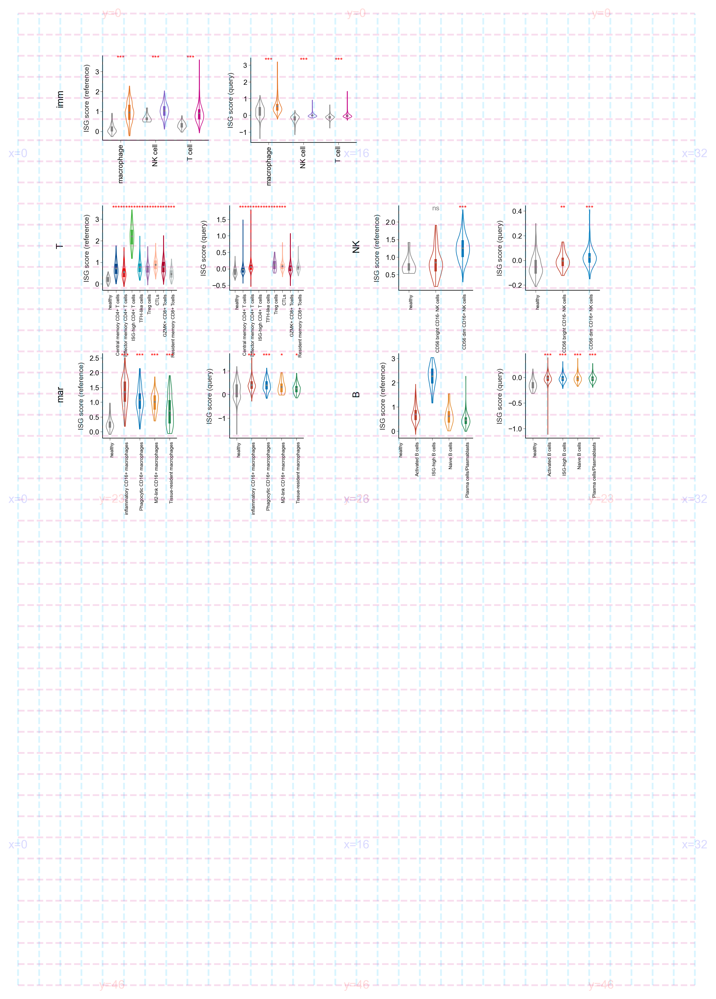

In [28]:
plt.close("all")
a4p = pl.figure.A4Page()
y = 2
with Block("ISGs imm", context=dict(x=4, y=y, item='imm')) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict('ct', rotation=90, fontsize=6)
    )

    ax = a4p.add_ax(context.x, context.y, 5, 4, rc=pl.rc_frame)
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_ylabel("ISG score (reference)")
        ax.set_xticks(ppara_data['imm_Utest_score_ISGs_ref']['x'],
                      ppara_data['imm_Utest_score_ISGs_ref'].index)
        ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
    context.x += 7
    ax = a4p.add_ax(context.x, context.y + 0.1, 5, 4, rc=pl.rc_frame)
    with Block("que"):
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (query)")
        ax.set_xticks(ppara_data['imm_Utest_score_ISGs_que']['x'],
                      ppara_data['imm_Utest_score_ISGs_que'].index)
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
y += 7
with Block("ISGs T", context=dict(x=4, y=y, item='T')) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict("lt", rotation=90),
    )
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (reference)")
        ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
    context.x += 6
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("que"):
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (query)")
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)

with Block("ISGs NK", context=dict(x=18, y=y, item='NK')) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict("lt", rotation=90),
    )
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (reference)")
        ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
    context.x += 6
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("que"):
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (query)")
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
y += 7
with Block("ISGs mar", context=dict(x=4, y=y, item='mar')) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict("lt", rotation=90),
    )
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (reference)")
        ppara_data['{}_Utest_score_ISGs_ref'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
    context.x += 6
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (query)")
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)

with Block("ISGs B", context=dict(x=18, y=y, item='B')) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict("lt", rotation=90),
    )
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("ref"):
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (reference)")
    context.x += 6
    ax = a4p.add_ax(context.x, context.y + 0.1, 3.5, 4, rc=pl.rc_frame)
    with Block("que"):
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax=ax, **kw_func_plot)
        ax.set_ylabel("ISG score (query)")
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
a4p.add_grid(.15)
# a4p.fig

## human statue

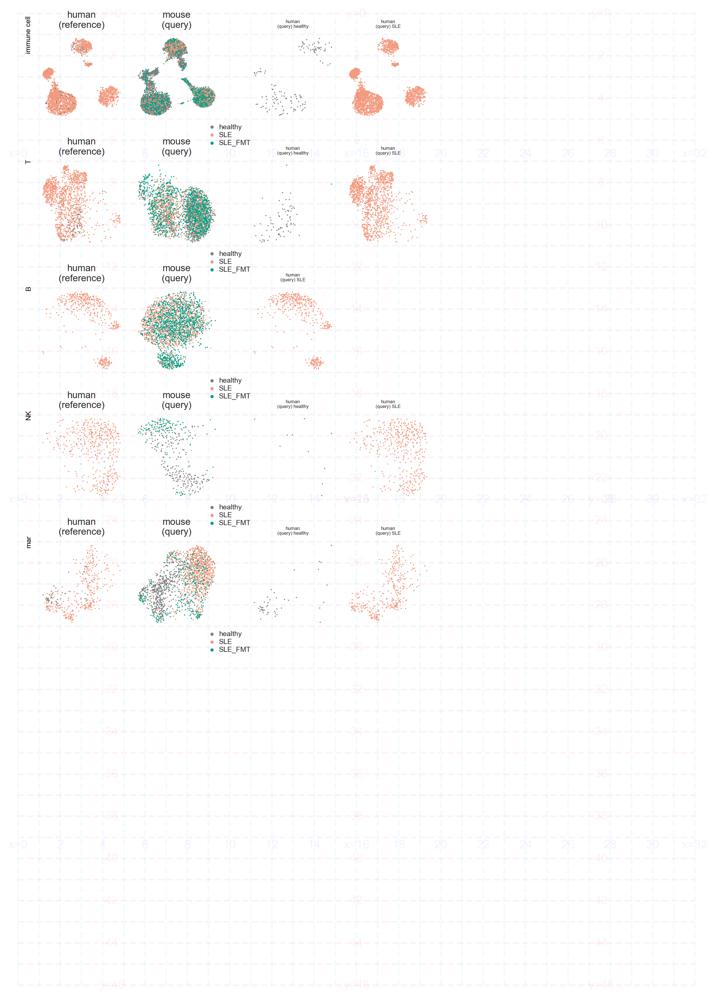

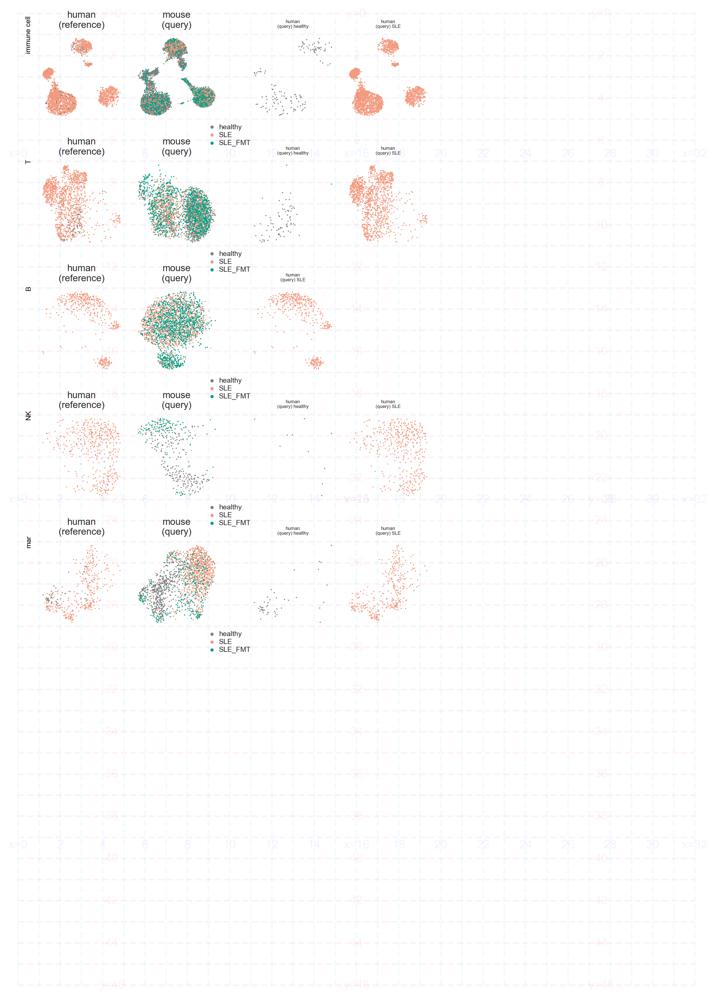

In [29]:
plt.close("all")
a4p = pl.figure.A4Page()
y = 1
with Block("umap status imm", context=dict(x=1, y=y, size=1, item='imm', key='preobs_status',
                                           cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'immune cell',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+8, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_ref, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('human\n(query) {}'.format(status), fontsize=4)

    del adata, adata_ref, adata_que, ax
y += 6
with Block("umap status T", context=dict(x=1, y=y, size=1, item='T', key='preobs_status',
                                         cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'T',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+8, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_ref, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('human\n(query) {}'.format(status), fontsize=4)

    del adata, adata_ref, adata_que, ax
y += 6
with Block("umap status B", context=dict(x=1, y=y, size=1, item='B', key='preobs_status',
                                         cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'B',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+8, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_ref, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('human\n(query) {}'.format(status), fontsize=4)

    del adata, adata_ref, adata_que, ax
y += 6
with Block("umap status NK", context=dict(x=1, y=y, size=1, item='NK', key='preobs_status',
                                          cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'NK',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+8, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_ref, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('human\n(query) {}'.format(status), fontsize=4)

    del adata, adata_ref, adata_que, ax
y += 6
with Block("umap status mar", context=dict(x=1, y=y, size=1, item='mar', key='preobs_status',
                                           cmap=ppara_cmap['status'])) as context:
    a4p.add_text_with_ax(a4p.add_ax(context.x-.5, context.y, 1, 4), 'mar',
                         fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=6))
    a4p.area_update(context.x, context.y, 1, 2, 4, 4, gap_width=.5)
    adata_ref = ppara_adata['{}_ref'.format(context.item)]
    adata_que = ppara_adata['{}_que'.format(context.item)]
    for ax, adata, title in zip(a4p.area_yield_ax(),
                                [adata_ref, adata_que],
                                'human\n(reference),mouse\n(query)'.split(',')):
        adata = ut.sc.load_obsm_UMAP(adata, 'UMAP1,UMAP2'.split(','))
        ut.sc.pl.umap(adata, context.key, ax=ax, size=1, cmap=context.cmap)
        ax.set_title(title)
        ax.set_rasterized(True)
    pl.cmap.show(context.cmap, ax=a4p.add_ax(context.x+8, context.y+4, 1, 1.5), size=20)

    context.x += 10
    with Block("umap status csMAHN"):
        adata = ut.sc.load_obsm_UMAP(adata_ref, 'UMAP1,UMAP2'.split(','))
        a4p.area_update(context.x, context.y, 1, len(
            adata.obs[context.key].unique()), 4, 4, gap_width=.5)
        for ax, status in zip(a4p.area_yield_ax(), adata.obs[context.key].unique()):
            ut.sc.pl.umap(ut.sc.subset_adata(adata, context.key, status),
                          context.key, ax=ax, size=context.size, cmap=context.cmap)
            ax.set_rasterized(True)
            ax.set_title('human\n(query) {}'.format(status), fontsize=4)

    del adata, adata_ref, adata_que, ax

# pl.tl_savefig(a4p.fig,'{}_{}_human_status.svg'.format(item, model),p_pdf)
# pl.tl_savefig(a4p.fig, "{}_{}_human_status.png".format(item, model), p_pdf)
# a4p.save_as_pdf(p_pdf.joinpath('{}_{}_human_status.pdf'.format(item, model)))
a4p.add_grid(alpha=.05)
a4p.fig

## posterior probability

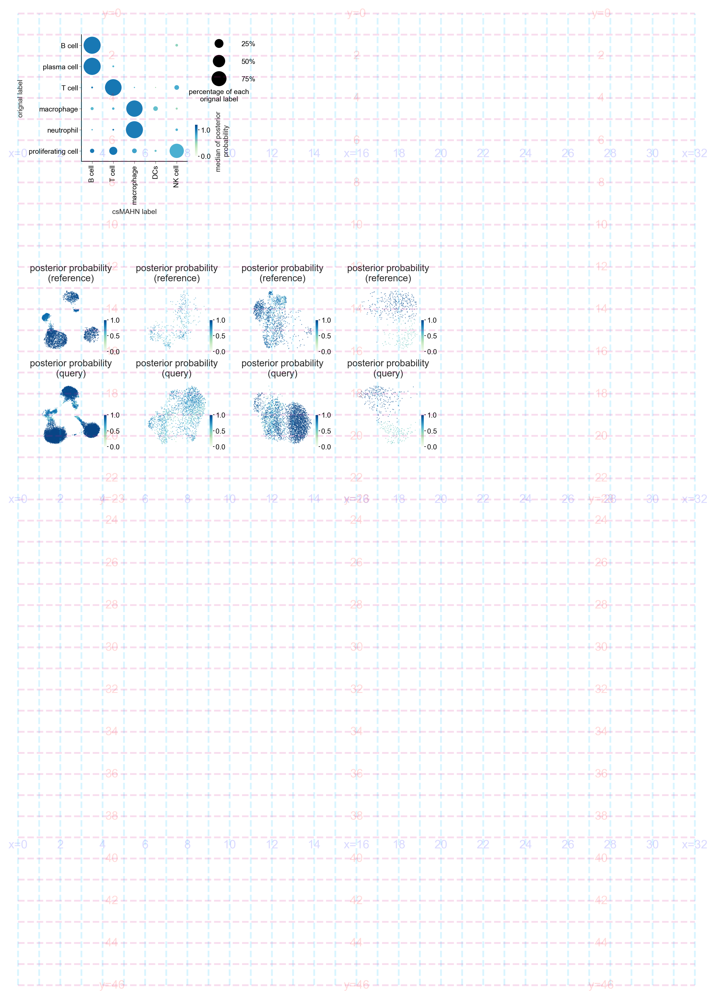

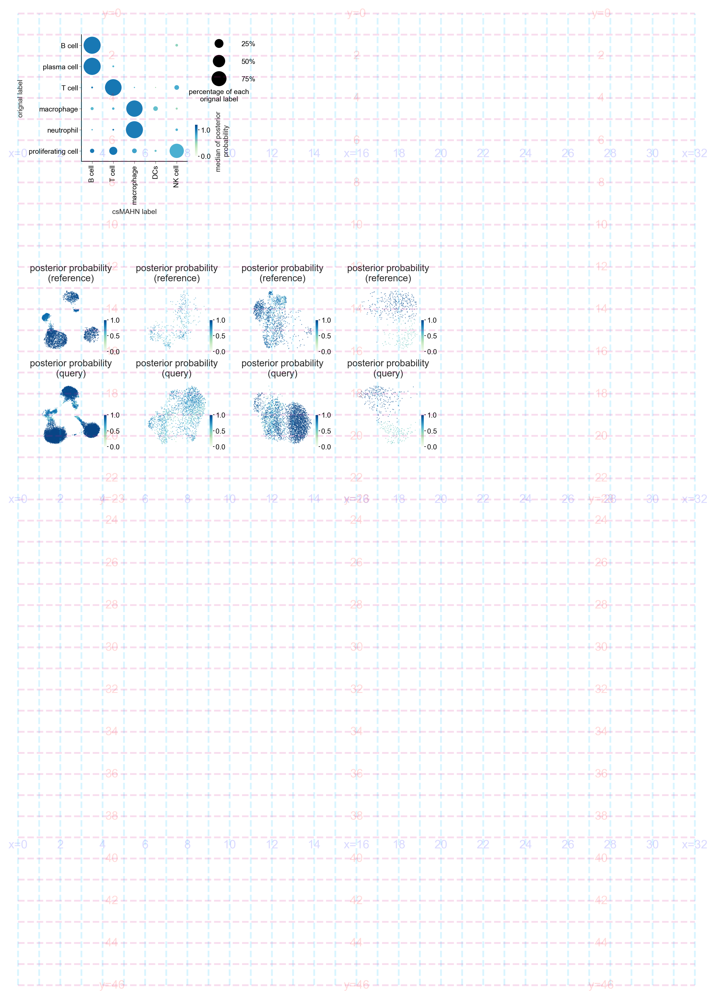

In [30]:
plt.close('all')
a4p = pl.figure.A4Page()
y = 1
with Block('posterior probability imm', context=dict(x=3, y=y, cmap='GnBu')) as context:
    kw_cbar=dict(format='{x:.1f}', aspect=10,label='median of posterior \nprobability')
    ppara = dict(
        data=ppara_adata['imm_hm'].obs.query("dataset_type == 'que' "),
        kw_bubble=dict(vmax=1.2, vmin=0, cmap=context.cmap),
        order_row='B cell,plasma cell,T cell,macrophage,neutrophil,proliferating cell'.split(','),
        order_col='B cell,T cell,macrophage,DCs,NK cell'.split(','))
    ax = a4p.add_ax(context.x, context.y, 5, 6, rc=pl.rc_frame)
    cbar = dotplot_max_prob_median(ax=ax, **ppara)
    ax.set_ylabel('orignal label')
    ax.set_xlabel('csMAHN label')
    ax = a4p.add_ax(context.x+4.5, context.y+4, 1, 2, rc=pl.rc_blank)
    cbar = a4p.fig.colorbar(cbar, ax=ax, **kw_cbar)
    cbar.ax.tick_params('both', width=.5, length=1.5, color='black')
    del ppara, ax, cbar, kw_cbar

with Block('legend percentage', context=dict(x=8.5, y=y)) as context:
    ax = a4p.add_ax(context.x, context.y, 2, 2.5, rc=pl.tl_rc(pl.rc_blank,
                                                              {'ytick.labelright': True, 'xtick.labelbottom': True}))
    dotplot_marker_legend(ax=ax, draw_cbar=False)
    ax.set_xticklabels(['percentage of each\norignal label'])

with Block("亚群的后验概率， 真实标签仅有一种，不画"):
    # with Block('posterior probability mar', context=dict(x=15, y=y, cmap='bwr')) as context:
    #     kw_cbar=dict(format='{x:.1f}', aspect=10,label='median of posterior \nprobability')
    #     ppara = dict(
    #         data=ppara_adata['mar_hm'].obs.query("dataset_type == 'que' "),
    #         kw_bubble=dict(vmax=1.2, vmin=0, cmap=context.cmap),
    #         order_col=ppara_data['order_cell_type']['macrophage']
    #     )
    #     ax = a4p.add_ax(context.x, context.y, 4, 1, rc=pl.rc_frame)
    #     cbar = dotplot_max_prob_median(ax=ax, **ppara)
    #     ax.set_ylabel('orignal label')
    #     ax.set_xlabel('csMAHN label')
    #     del ax, cbar, ppara,kw_cbar
    
    # with Block('posterior probability T', context=dict(x=22, y=y, cmap='bwr')) as context:
    #     kw_cbar=dict(format='{x:.1f}', aspect=10,label='median of posterior \nprobability')
    #     data = ppara_adata['T_hm'].obs.query("dataset_type == 'que' ").copy()
    #     data['true_label'] = 'T cell'
    #     ppara = dict(
    #         data=data,
    #         kw_bubble=dict(vmax=1.2, vmin=0, cmap=context.cmap),
    #         order_col=ppara_data['order_cell_type']['T cell']
    #     )
    #     ax = a4p.add_ax(context.x, context.y, 6, 1, rc=pl.rc_frame)
    #     cbar = dotplot_max_prob_median(ax=ax, **ppara)
    #     ax.set_ylabel('orignal label')
    #     ax.set_xlabel('csMAHN label')
    #     del ax, cbar, data, ppara, kw_cbar
    
    # with Block('posterior probability NK', context=dict(x=30, y=y, cmap='bwr')) as context:
    #     kw_cbar=dict(format='{x:.1f}', aspect=10,label='median of posterior \nprobability')
    #     data = ppara_adata['NK_hm'].obs.query("dataset_type == 'que' ").copy()
    #     ppara = dict(
    #         data=data,
    #         kw_bubble=dict(vmax=1.2, vmin=0, cmap=context.cmap),
    #         order_col=ppara_data['order_cell_type']['NK cell']
    #     )
    #     ax = a4p.add_ax(context.x, context.y, 2, 1, rc=pl.rc_frame)
    #     cbar = dotplot_max_prob_median(ax=ax, **ppara)
    #     ax.set_ylabel('orignal label')
    #     ax.set_xlabel('csMAHN label')
    #     del ax, cbar, data, ppara, kw_cbar
    pass
y += 12

with Block("umap ISGs imm", context=dict(x=1, y=y, size=.1,item='imm',cmap='GnBu')) as context:
    kw_umap_gene=dict(size=context.size,cmap=context.cmap, vmax=1, vmin=0)
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_ref'.format(context.item)], 'max_prob',
                                  draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                  kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(reference)')
    
    context.y += 4.5
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_que'.format(context.item)], 'max_prob',
                                       draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                       kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(query)')
    del kw_umap_gene

with Block("umap ISGs mar", context=dict(x=6, y=y, size=.1,item='mar',cmap='GnBu')) as context:
    kw_umap_gene=dict(size=context.size,cmap=context.cmap, vmax=1, vmin=0)
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_ref'.format(context.item)], 'max_prob',
                                  draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                  kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(reference)')
    
    context.y += 4.5
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_que'.format(context.item)], 'max_prob',
                                       draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                       kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(query)')
with Block("umap ISGs T", context=dict(x=11, y=y, size=.1,item='T',cmap='GnBu')) as context:
    kw_umap_gene=dict(size=context.size,cmap=context.cmap, vmax=1, vmin=0)
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_ref'.format(context.item)], 'max_prob',
                                  draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                  kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(reference)')
    
    context.y += 4.5
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_que'.format(context.item)], 'max_prob',
                                       draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                       kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(query)')

with Block("umap ISGs NK", context=dict(x=16, y=y, size=.1,item='NK',cmap='GnBu')) as context:
    kw_umap_gene=dict(size=context.size,cmap=context.cmap, vmax=1, vmin=0)
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_ref'.format(context.item)], 'max_prob',
                                  draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                  kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(reference)')
    
    context.y += 4.5
    ppara_func['ut_sc_umap_gene'](a4p, context.x, context.y, ppara_adata['{}_que'.format(context.item)], 'max_prob',
                                       draw_cbar=True,kw_umap_gene=kw_umap_gene,
                                       kw_cbar=dict(format='{x:.1f}')).set_title('posterior probability\n(query)')


# pl.tl_savefig(a4p.fig,'{}_{}_max_prob_median.svg'.format(item, model),p_pdf)
# pl.tl_savefig(a4p.fig,'{}_{}_max_prob_median.png'.format(item, model),p_pdf)
# a4p.save_as_pdf(p_pdf.joinpath('{}_{}_max_prob_median.pdf'.format(item, model)))
a4p.add_grid()
a4p.fig

## 弃用

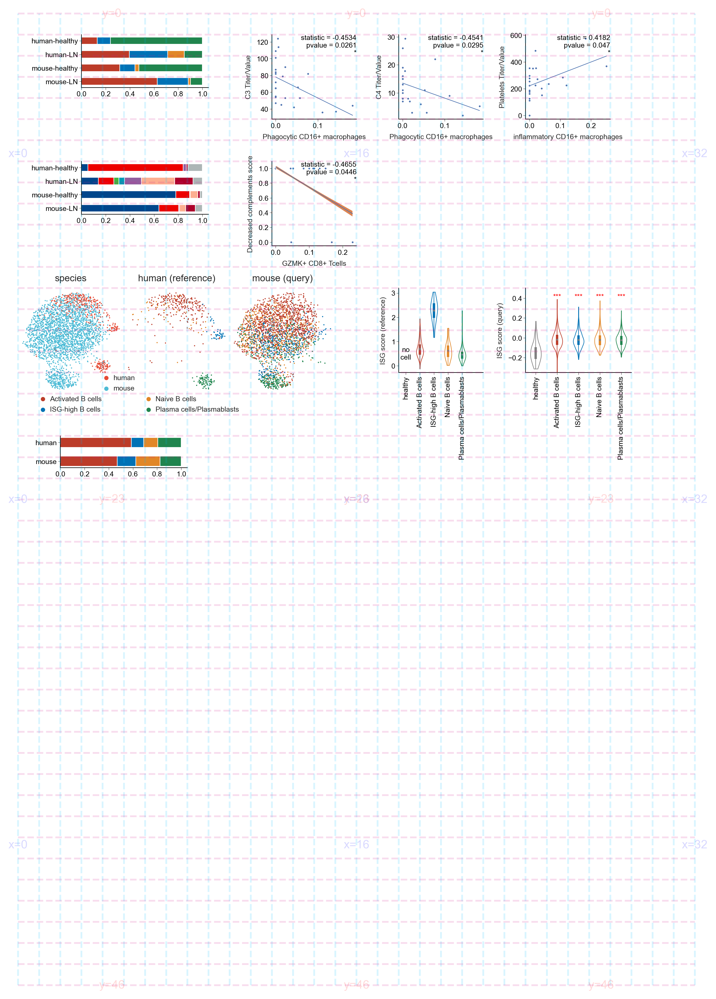

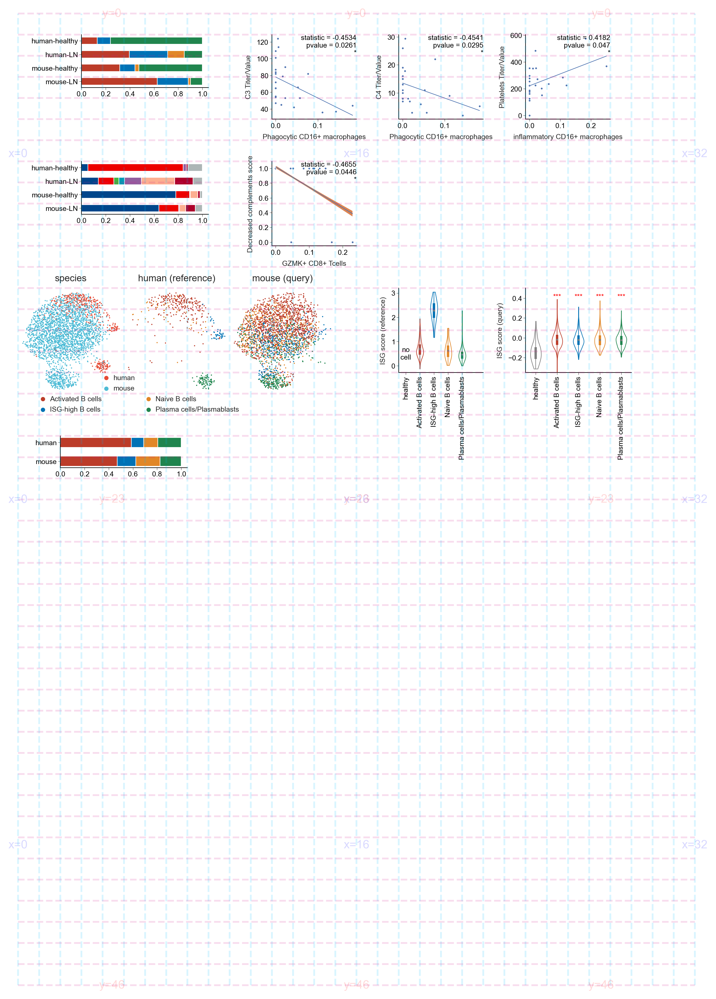

In [31]:
plt.close('all')
a4p = pl.figure.A4Page()
y = 1
with Block("1", context=dict(x=0, y=y)) as context:

    with Block("hbar mar", context=dict(x=3, y=y)) as context:
        ax = a4p.add_ax(context.x, context.y, 6, 2.5, rc=pl.rc_frame)

        df_plot = ppara_data['hm_mar_hbar']
        cmap = ppara_cmap['mar_cell_type']
        para = dict(gap_between_group=1.5, width_one_bar=1,
                    width_ratio=.8, to_horizontal=True)
        for i, (k) in enumerate(df_plot.filter(regex='^(?!bottom_)').columns):
            pl.bar(ax, df_plot, key_height=k, cmap=cmap, bottom='bottom_{}'.format(k),
                   group_counts=0, ngroup=0, **para)
        pl.bar_add_ticks(ax, df_plot, group_counts=0, offset=.5,
                         fontdict=dict(fontsize=6), **para)
        del df_plot, ax, i, k
    with Block("spearmanr clinical_ref", context=dict(x=12, y=y,
                                                      k1='Phagocytic CD16+ macrophages',
                                                      k2='1b. C3 Titer/Value')) as context:
        ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
        df_plot = ppara_data['clinical_ref']
        ppara_func['linear_correlation'](ax, df_plot, context.k1, context.k2)
        ax.set_ylabel(' '.join(context.k2.split(' ')[1:]))
    with Block("spearmanr clinical_ref", context=dict(x=18, y=y,
                                                      k1='Phagocytic CD16+ macrophages',
                                                      k2='2b. C4 Titer/Value')) as context:
        ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
        df_plot = ppara_data['clinical_ref']
        ppara_func['linear_correlation'](ax, df_plot, context.k1, context.k2)
        ax.set_ylabel(' '.join(context.k2.split(' ')[1:]))
    with Block("spearmanr clinical_ref", context=dict(x=24, y=y,
                                                      k1='inflammatory CD16+ macrophages',
                                                      k2='4b. Platelets Titer/Value')) as context:
        ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
        df_plot = ppara_data['clinical_ref']
        ppara_func['linear_correlation'](ax, df_plot, context.k1, context.k2)
        ax.set_ylabel(' '.join(context.k2.split(' ')[1:]))
y += 6
with Block("2", context=dict(x=0, y=y)) as context:
    with Block("hbar T", context=dict(x=3, y=y)) as context:
        ax = a4p.add_ax(context.x, context.y, 6, 2.5, rc=pl.rc_frame)

        df_plot = ppara_data['hm_T_hbar']
        cmap = ppara_cmap['T_cell_type']
        para = dict(gap_between_group=1.5, width_one_bar=1,
                    width_ratio=.8, to_horizontal=True)
        for i, (k) in enumerate(df_plot.filter(regex='^(?!bottom_)').columns):
            pl.bar(ax, df_plot, key_height=k, cmap=cmap, bottom='bottom_{}'.format(k),
                   group_counts=0, ngroup=0, **para)
        pl.bar_add_ticks(ax, df_plot, group_counts=0, offset=.5,
                         fontdict=dict(fontsize=6), **para)
        del df_plot, ax, i, k
    with Block("spearmanr clinical_ref", context=dict(x=12, y=y,
                                                      k1='GZMK+ CD8+ Tcells', k2='5. Decreased complements score')) as context:
        ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
        df_plot = ppara_data['clinical_ref']
        ppara_func['linear_correlation'](ax, df_plot, context.k1, context.k2)
        ax.set_ylabel(' '.join(context.k2.split(' ')[1:]))
y += 6
# 3
# B
with Block("UMAP B", context=dict(x=0, y=y, size=1)) as context:
    ax = a4p.add_ax(context.x, context.y, 5, 5)
    ut.sc.pl.umap(
        ppara_adata["B_hm"], "sp", ax, cmap=ppara_cmap["sp"], size=context.size
    ), ax.set_title("species")
    ax.set_rasterized(True)

    cmap = ppara_cmap['B_cell_type']

    ax = a4p.add_ax(context.x + 5, context.y, 5, 5)
    ut.sc.pl.umap(ppara_adata["B_ref"], "model_label", ax, cmap=cmap, size=context.size,)
    ax.set_title("human (reference)")
    ax.set_rasterized(True)

    ax = a4p.add_ax(context.x + 10, context.y, 5, 5)
    ut.sc.pl.umap(ppara_adata["B_que"], 'model_label', ax, cmap=cmap, size=context.size)
    ax.set_title("mouse (query)")
    ax.set_rasterized(True)

    with Block("UMAP legend"):
        ax = a4p.add_ax(context.x + 4, context.y + 4, 1, 1)
        pl.cmap.show(ppara_cmap["sp"], fontdict=fontdict_default, ax=ax)

        a4p.area_update(context.x+1, context.y + 5, 1, 2, 1, 1, gap_width=4)
        # a4p.area_show()
        for ax, keys in zip(
            a4p.area_yield_ax(rc=pl.rc_blank),
            ut.arr.yield_ele_by_count(
                list(cmap.keys()), [2, 2]
            ),
        ):
            pl.cmap.show(subset_dict(cmap, keys), ax=ax)

with Block("ISGs B", context=dict(x=18, y=y, item='B')) as context:
    # a4p.add_text_with_ax(a4p.add_ax(context.x-2, context.y+2, 1, 2), context.item,
    #                     fontdict=pl.tl_fontdict('cc', rotation=90, fontsize=8))
    kw_func_plot = dict(
        cmap=ppara_cmap["{}_score_group_cell_type".format(context.item)],
        fontdict_xticks=pl.tl_fontdict('ct', rotation=90, fontsize=6))

    with Block("ref"):
        ax = a4p.add_ax(context.x, context.y, 4, 4, rc=pl.rc_frame)
        kw_func_plot.update(
            data=ppara_adata["{}_ref".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],

        )
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_xlim(-.5, len(kw_func_plot['order'])+.5)
        ax.set_xticks(np.arange(len(kw_func_plot['order'])), kw_func_plot['order'])
        ax.set_ylabel("ISG score (reference)")
        ax.text(0, .5, 'no\ncell', **pl.tl_fontdict('cc'))

        del ax
    context.x += 6
    with Block("que"):
        ax = a4p.add_ax(context.x, context.y, 5, 4, rc=pl.rc_frame)
        kw_func_plot.update(
            data=ppara_adata["{}_que".format(context.item)].obs,
            order=ppara_data["{}_order_score_group_cell_type".format(context.item)],
        )
        ppara_func["violin_gene_score_update"](ax, **kw_func_plot)
        ax.set_xticks(np.arange(len(kw_func_plot['order'])), kw_func_plot['order'])
        ax.set_ylabel("ISG score (query)")
        ppara_data['{}_Utest_score_ISGs_que'.format(context.item)].apply(
            lambda row: ppara_func['pl_text_marker'](row, ax), axis=1)
        ax.set_ylim([-.35, .5])
        del ax
    del kw_func_plot
y += 7
with Block("hbar B", context=dict(x=2, y=y)) as context:
    ax = a4p.add_ax(context.x, context.y, 6, 1.5, rc=pl.rc_frame)

    df_plot = ppara_data['hm_B_hbar']
    cmap = ppara_cmap['B_cell_type']
    para = dict(gap_between_group=1.5, width_one_bar=1,
                width_ratio=.8, to_horizontal=True)
    for i, (k) in enumerate(df_plot.filter(regex='^(?!bottom_)').columns):
        pl.bar(ax, df_plot, key_height=k, cmap=cmap, bottom='bottom_{}'.format(k),
               group_counts=0, ngroup=0, **para)
    pl.bar_add_ticks(ax, df_plot, group_counts=0, offset=.5,
                     fontdict=dict(fontsize=6), **para)
    del df_plot, ax, i, k

# pl.tl_savefig(a4p.fig,'{}_{}_discard.svg'.format(item, model),p_pdf)
# pl.tl_savefig(a4p.fig,'{}_{}_discard.png'.format(item, model),p_pdf)
# a4p.save_as_pdf(p_pdf.joinpath('{}_{}_discard.pdf'.format(item, model)))

a4p.add_grid(.15)
a4p.fig

In [32]:
print('\n[finish]\n'.center(100,'-'))

---------------------------------------------
[finish]
---------------------------------------------
